In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"

%load_ext autoreload

In [2]:
import jax
import jax.numpy as jnp
from jax import random, vmap, jit, grad

from flax import linen as nn

import matplotlib.pyplot as plt
import pickle

In [17]:
%autoreload 2
from archs import MonotonicActuator, RingEncoding, RPNEnsemble, MLP
from train_utils import Operator, BatchedDataset

# Loading Data

In [18]:
def join_datasets(ds):
    # unpack quantities
    us = [d[0][0] for d in ds]
    ys = [d[0][1] for d in ds]
    fs = [d[1] for d in ds]
    ws = [d[2] for d in ds]
    
    # join quantities of interest
    us = jnp.concatenate(us)
    ys = jnp.concatenate(ys)
    fs = jnp.concatenate(fs)
    ws = jnp.concatenate(ws)

    return (us, ys), fs, ws

In [19]:
with open('model_data_dictionary_N_Pa.pkl', 'rb') as file:
    full_data_dict = pickle.load(file)
    train_data = join_datasets(full_data_dict.values()) # use all data for training


(train_us, train_ys), train_fs, train_ws = train_data

print(f"us shape: {train_us.shape}")
print(f"ys shape: {train_ys.shape}")
print(f"fs shape: {train_fs.shape}")
print(f"ws shape: {train_ws.shape}")

us shape: (188318, 7)
ys shape: (188318, 1)
fs shape: (188318, 1)
ws shape: (188318, 1)


# Polynomial degree 1

### Training

In [ ]:
# Define Model
ring_encoder = RingEncoding(24,
                            MLP([16,5]))
latent_encoder = MLP([32, 32, 32, 32], output_activation=nn.gelu)
arch = MonotonicActuator(ring_encoder,
                     latent_encoder,
                     polynomial_degree=1)
ensemble = RPNEnsemble(arch, 32)

data_loader = BatchedDataset(train_data, key=random.PRNGKey(58), batch_size=50_000, has_weights=True)
init_batch = next(iter(data_loader))

model = Operator(ensemble, init_batch, has_weights=True)
print(model.tabulate())


                                             RPNEnsemble Summary                                              
┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┓
┃ path                 ┃ module            ┃ inputs             ┃ outputs             ┃ params               ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━┩
│                      │ RPNEnsemble       │ - float32[50000,7] │ float32[32,50000,1] │                      │
│                      │                   │ - float32[50000,1] │                     │                      │
├──────────────────────┼───────────────────┼────────────────────┼─────────────────────┼──────────────────────┤
│ OperatorEnsemble_0   │ OperatorEnsemble  │ - float32[50000,7] │ float32[64,50000,1] │                      │
│                      │                   │ - float32[50000,1] │                     │                      │


In [ ]:
# train model
model = Operator(ensemble, init_batch, has_weights=True) #restart model
data_loader = BatchedDataset(train_data, key=random.PRNGKey(58), batch_size=500, has_weights=True) # restart data loader
model.train(data_loader, nIter=10_000)

100%|██████████| 10000/10000 [00:13<00:00, 747.05it/s, loss=0.48970714, grad_norm=0.09744161]


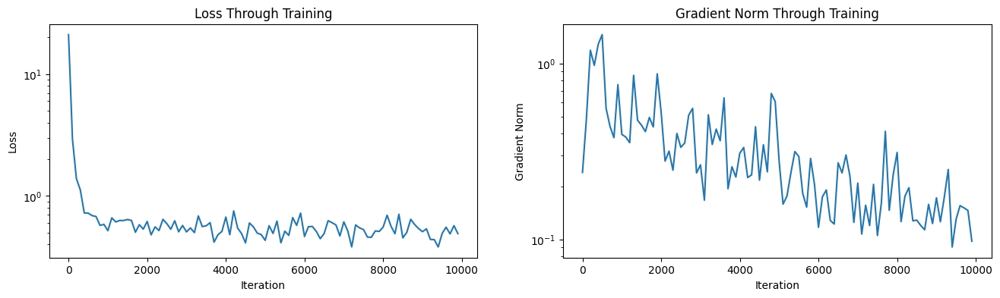

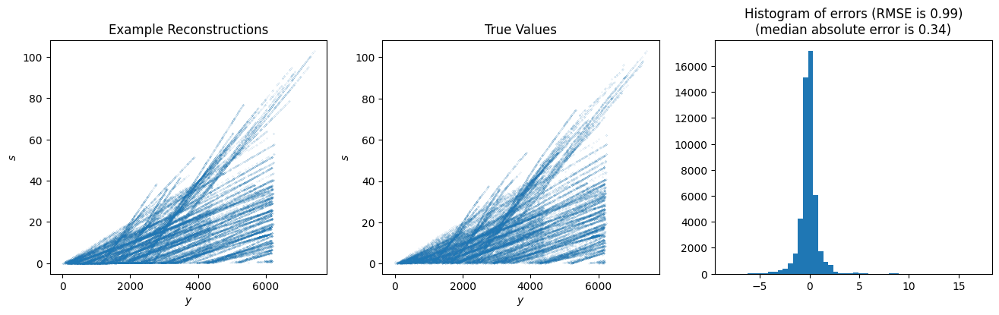

In [ ]:
# plot loss log and sample predictions
model.plot_training_log()
model.plot_predictions(init_batch)

### Looking at UQ

In [ ]:
num_ps = 101
num_hs=8
ps = jnp.linspace(0, 8000, num_ps)
hs = jnp.linspace(0, 70, num_hs)

ps, hs

(Array([   0.,   80.,  160.,  240.,  320.,  400.,  480.,  560.,  640.,
         720.,  800.,  880.,  960., 1040., 1120., 1200., 1280., 1360.,
        1440., 1520., 1600., 1680., 1760., 1840., 1920., 2000., 2080.,
        2160., 2240., 2320., 2400., 2480., 2560., 2640., 2720., 2800.,
        2880., 2960., 3040., 3120., 3200., 3280., 3360., 3440., 3520.,
        3600., 3680., 3760., 3840., 3920., 4000., 4080., 4160., 4240.,
        4320., 4400., 4480., 4560., 4640., 4720., 4800., 4880., 4960.,
        5040., 5120., 5200., 5280., 5360., 5440., 5520., 5600., 5680.,
        5760., 5840., 5920., 6000., 6080., 6160., 6240., 6320., 6400.,
        6480., 6560., 6640., 6720., 6800., 6880., 6960., 7040., 7120.,
        7200., 7280., 7360., 7440., 7520., 7600., 7680., 7760., 7840.,
        7920., 8000.], dtype=float32),
 Array([ 0., 10., 20., 30., 40., 50., 60., 70.], dtype=float32))

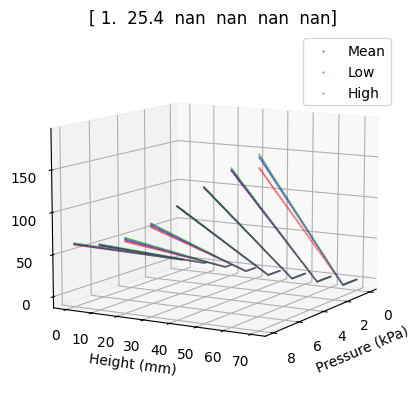

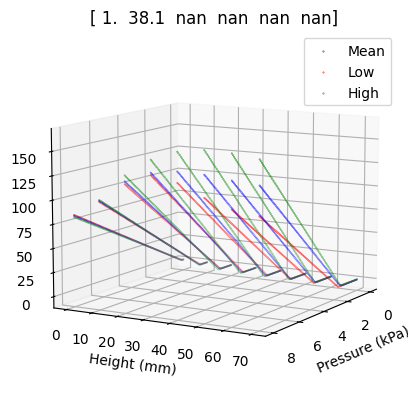

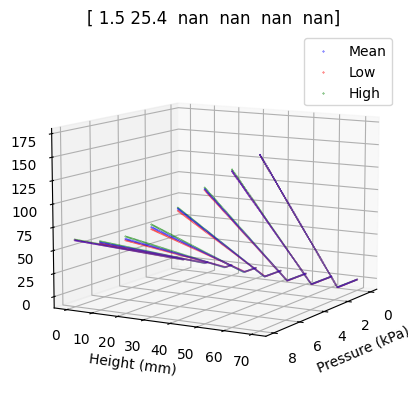

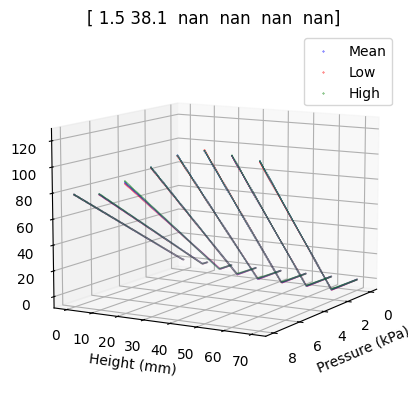

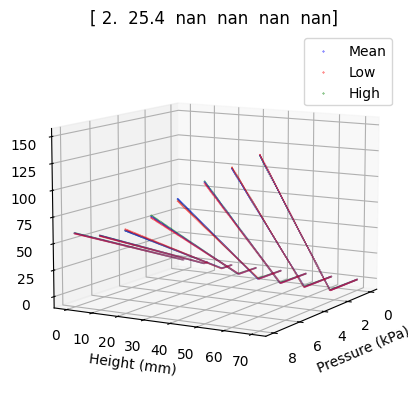

...

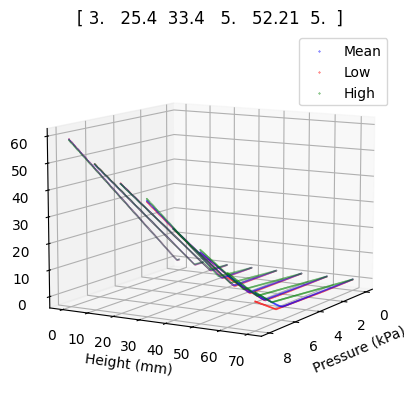

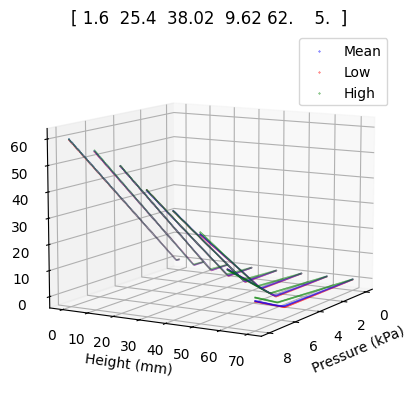

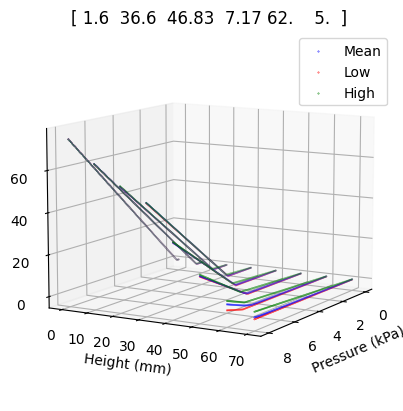

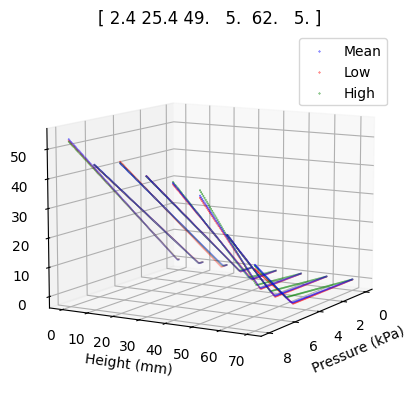

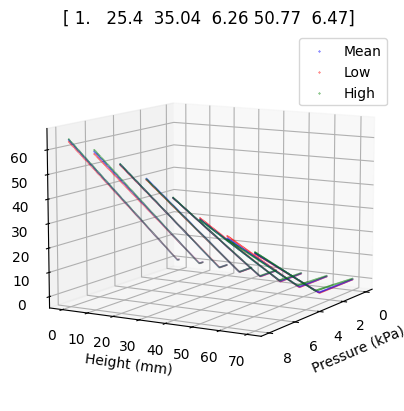

In [ ]:
for membrane in full_data_dict.keys():
    memb_coeffs = full_data_dict[membrane][0][0][0][1:]
    us = jnp.concatenate([
            hs[:,None],
            jnp.tile(memb_coeffs, (num_hs,1))
        ],axis=-1) # shape (num_hs, 7)

    us = jnp.repeat(us, num_ps, axis=0) # shape (num_hs*num_ps, 7)
    ys = jnp.tile(ps, num_hs)[:,None] # shape (num_hs*num_ps, 1)

    fs = model.apply(model.params, us, ys) # shape (num_ensemble, num_hs*num_ps, 1)
    max_idx = jnp.argmax(fs.mean(1).squeeze())
    max_pred = fs[max_idx]
    min_idx = jnp.argmin(fs.mean(1).squeeze())
    min_pred = fs[min_idx]
    avg_pred = fs.mean(0)

    # plot low_Fs
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(ys.squeeze()/1000, us[:,0], avg_pred.squeeze(), c='b', s=0.1, marker='o')
    ax.scatter(ys.squeeze()/1000, us[:,0], min_pred.squeeze(), c='r', s=0.1, marker='o')
    ax.scatter(ys.squeeze()/1000, us[:,0], max_pred.squeeze(), c='g', s=0.1, marker='o')
    ax.set_xlabel('Pressure (kPa)')
    ax.set_ylabel('Height (mm)')
    ax.set_zlabel('Force (N)')
    plt.legend(['Mean', 'Low', 'High'])
    plt.title(memb_coeffs)
    # change the view angle
    ax.view_init(elev=10, azim=30)

    plt.show()

membrane is [1.0, 25.4, nan, nan, nan, nan]


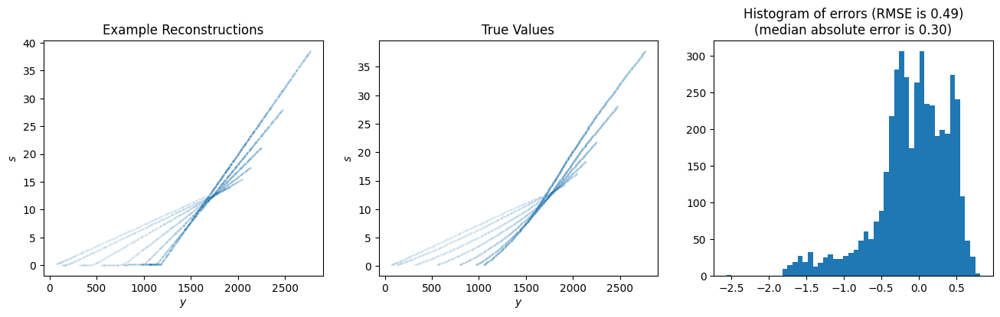

membrane is [1.0, 38.1, nan, nan, nan, nan]


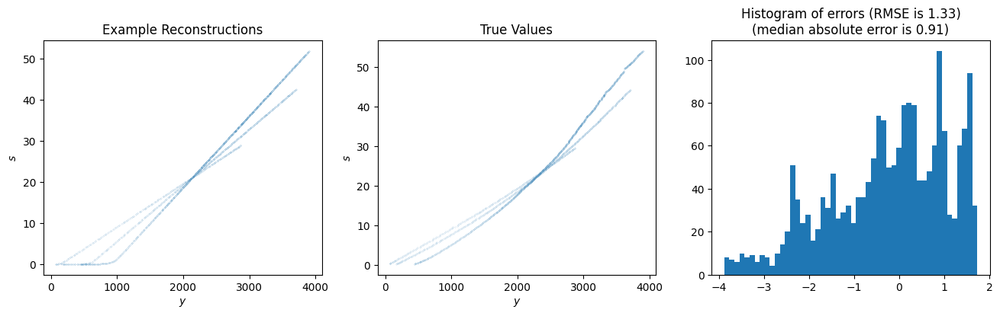

membrane is [1.5, 25.4, nan, nan, nan, nan]


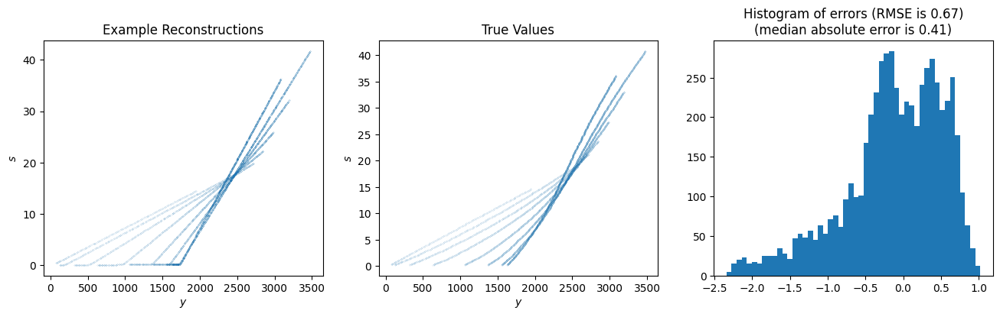

membrane is [1.5, 38.1, nan, nan, nan, nan]


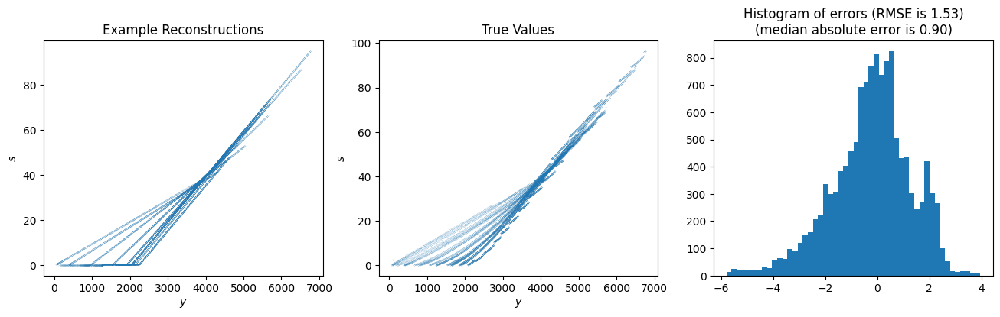

membrane is [2.0, 25.4, nan, nan, nan, nan]


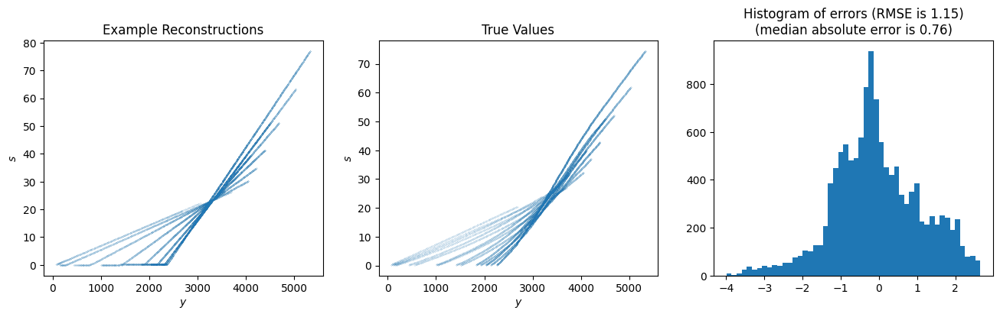

membrane is [2.0, 38.1, nan, nan, nan, nan]


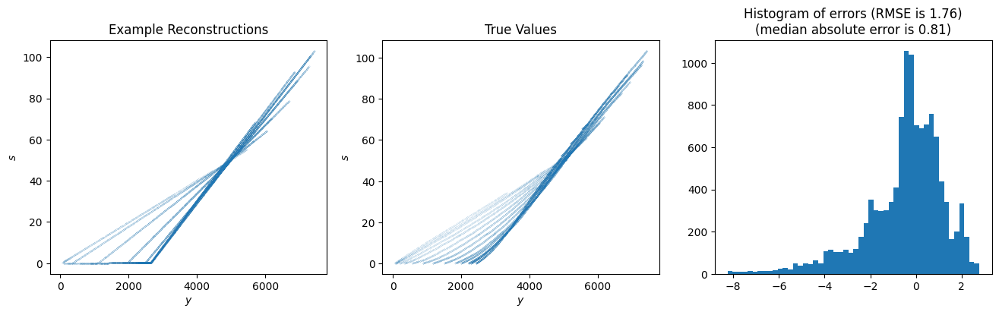

membrane is [1.0, 25.4, 41.2, 12.8, 62.0, 5.0]


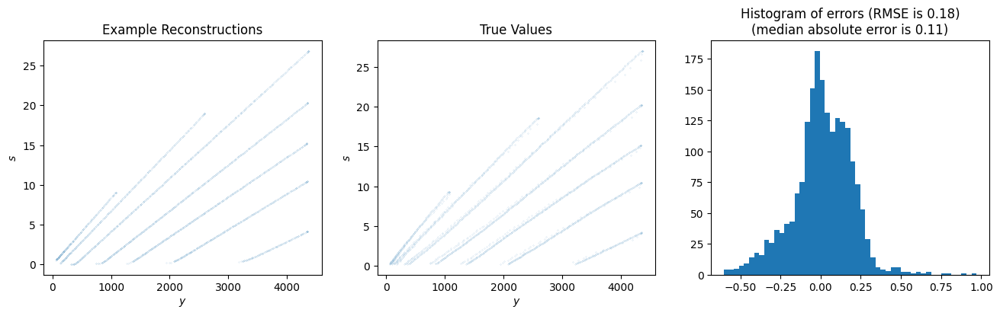

membrane is [3.0, 38.1, 49.0, 5.0, 62.0, 5.0]


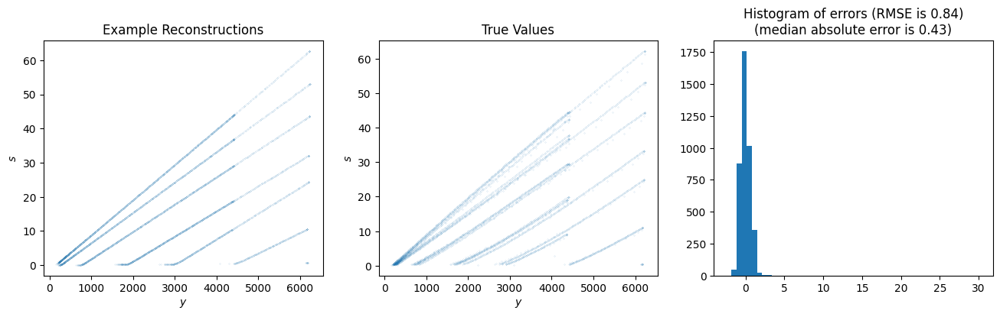

membrane is [3.0, 25.4, 34.73, 6.33, 55.53, 11.47]


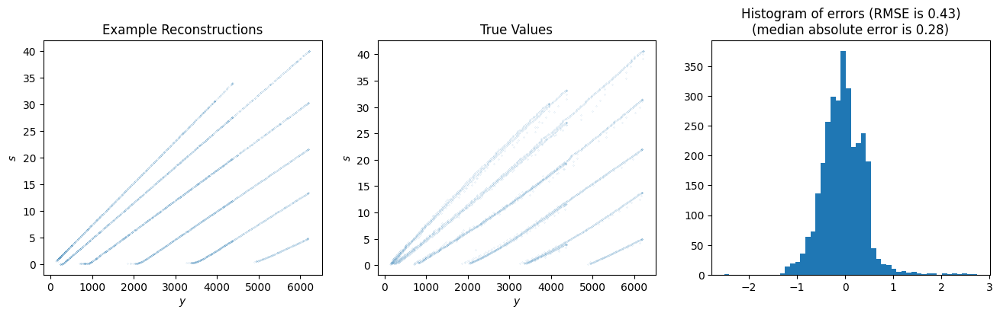

membrane is [1.0, 25.4, 33.4, 5.0, 46.4, 5.0]


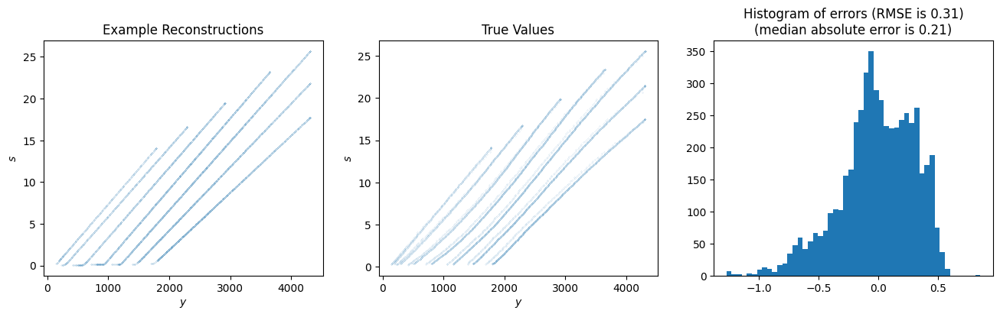

membrane is [1.0, 25.4, 33.4, 5.0, 57.05, 9.95]


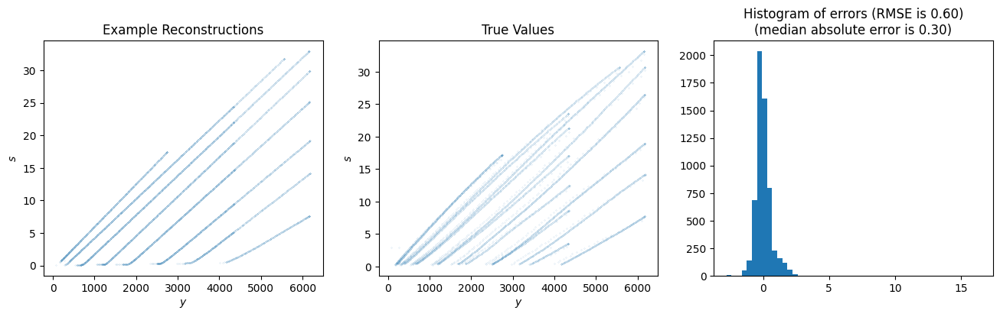

membrane is [1.0, 25.4, 49.0, 5.0, 62.0, 5.0]


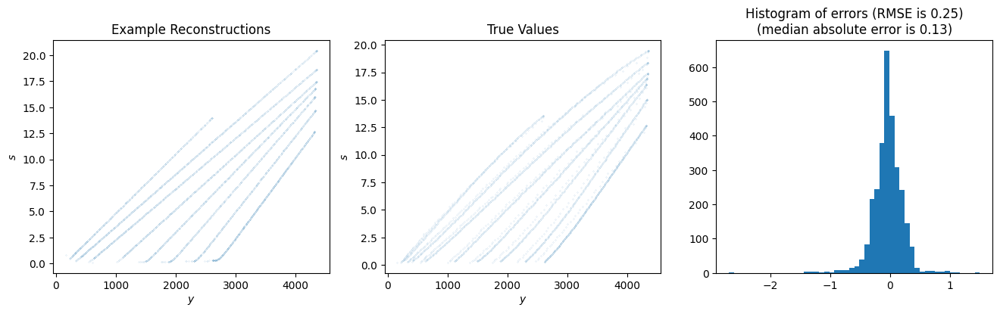

membrane is [1.0, 38.1, 46.1, 5.0, 59.1, 5.0]


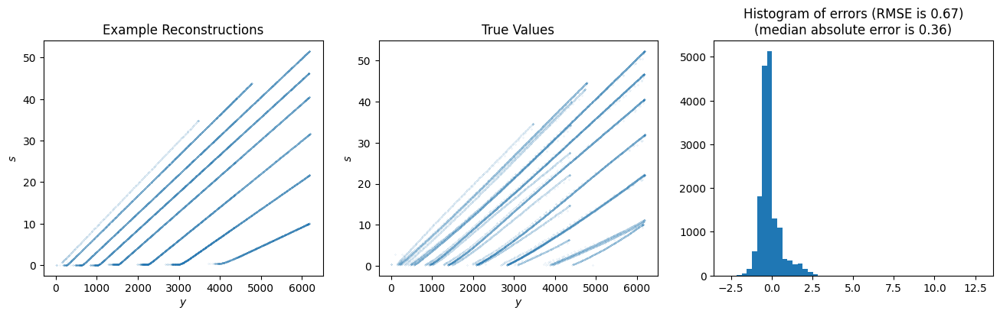

membrane is [1.0, 25.4, 37.69, 9.29, 58.49, 8.51]


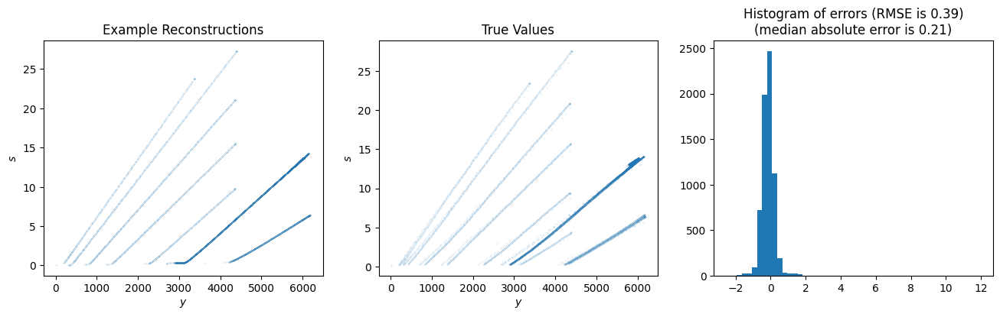

membrane is [1.0, 25.4, 36.06, 7.66, 51.72, 5.0]


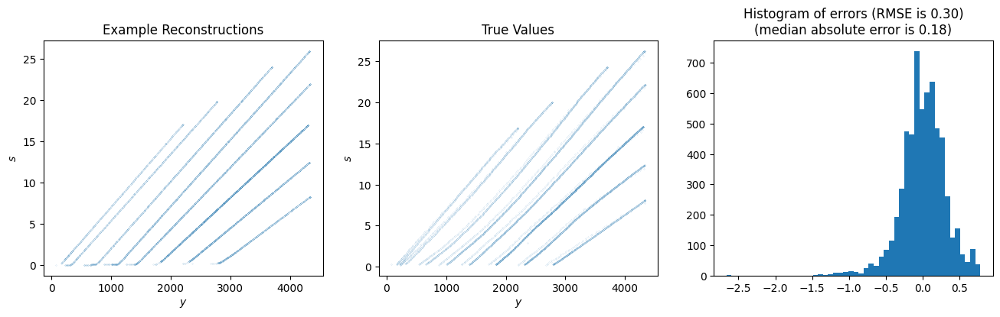

membrane is [1.0, 25.4, 44.81, 6.65, 60.73, 6.27]


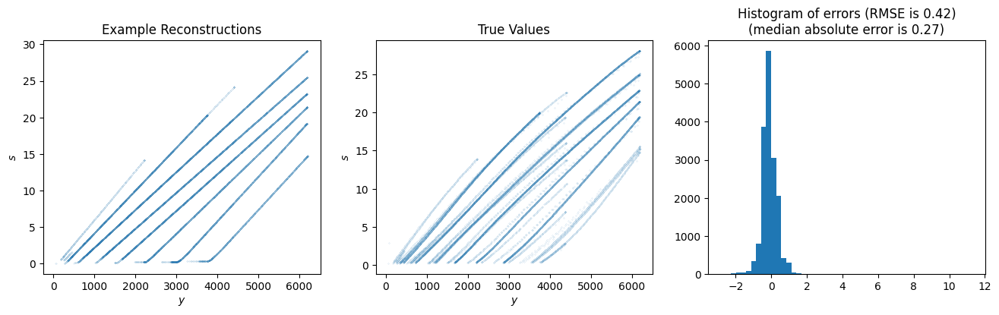

membrane is [3.0, 25.4, 40.43, 12.03, 61.23, 5.77]


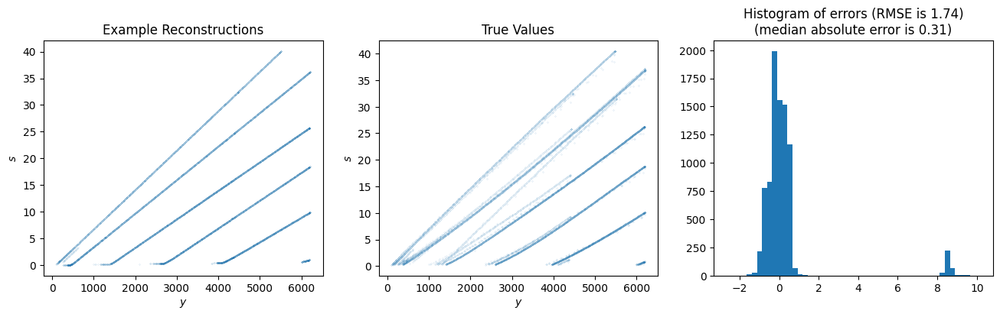

membrane is [3.0, 25.4, 33.4, 5.0, 52.21, 5.0]


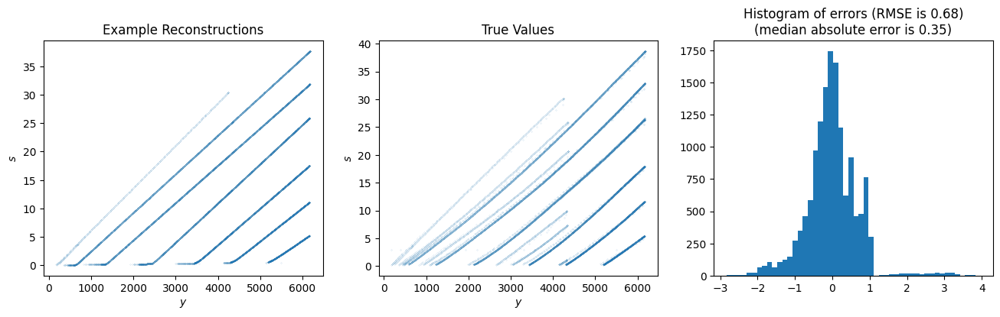

membrane is [1.6, 25.4, 38.02, 9.62, 62.0, 5.0]


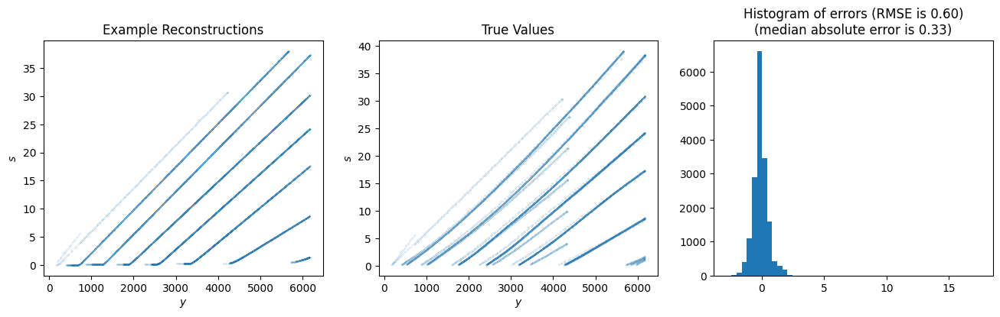

membrane is [1.6, 36.6, 46.83, 7.17, 62.0, 5.0]


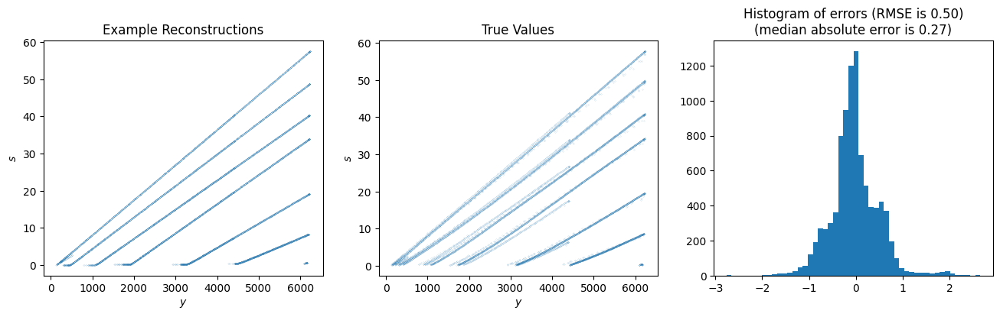

membrane is [2.4, 25.4, 49.0, 5.0, 62.0, 5.0]


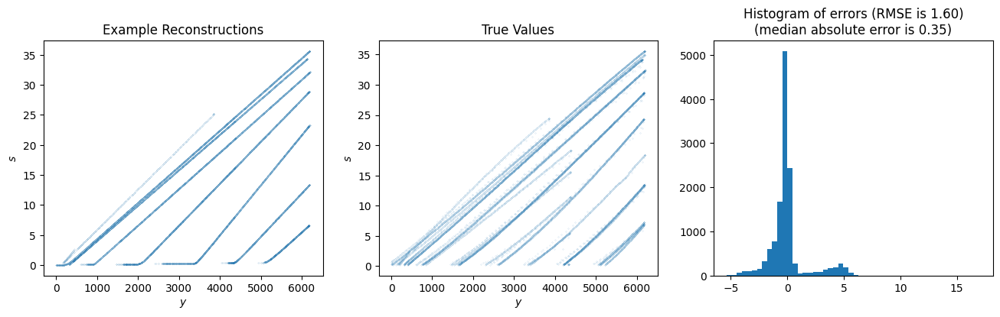

membrane is [1.0, 25.4, 35.04, 6.26, 50.77, 6.47]


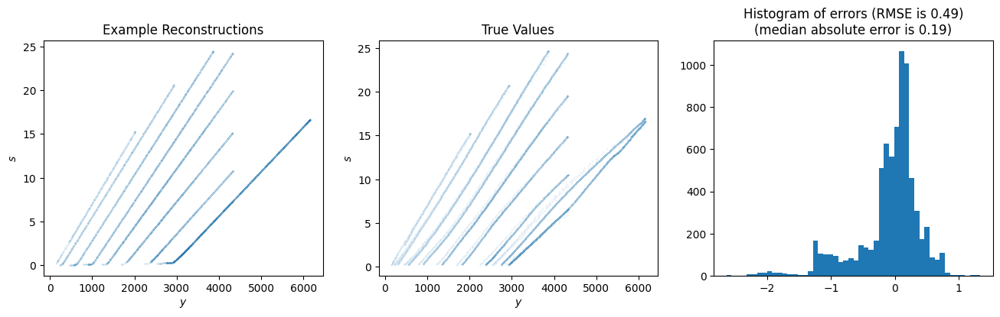

In [ ]:
for membrane in full_data_dict.keys():
    print(f"membrane is {membrane}")
    (us, ys), fs, ws = full_data_dict[membrane]
    fs=model.plot_predictions(full_data_dict[membrane], return_predictions=True, use_uq=True)

# Polynomial degree 2

### Training

In [37]:
# Define Model
ring_encoder = RingEncoding(24,
                            MLP([16,5]))
latent_encoder = MLP([32, 32, 32, 32], output_activation=nn.gelu)
arch = MonotonicActuator(ring_encoder,
                     latent_encoder,
                     polynomial_degree=2)
ensemble = RPNEnsemble(arch, 32)

data_loader = BatchedDataset(train_data, key=random.PRNGKey(58), batch_size=50_000, has_weights=True)
init_batch = next(iter(data_loader))

model = Operator(ensemble, init_batch, has_weights=True)
print(model.tabulate())


                                             RPNEnsemble Summary                                              
┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┓
┃ path                 ┃ module            ┃ inputs             ┃ outputs             ┃ params               ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━┩
│                      │ RPNEnsemble       │ - float32[50000,7] │ float32[32,50000,1] │                      │
│                      │                   │ - float32[50000,1] │                     │                      │
├──────────────────────┼───────────────────┼────────────────────┼─────────────────────┼──────────────────────┤
│ OperatorEnsemble_0   │ OperatorEnsemble  │ - float32[50000,7] │ float32[64,50000,1] │                      │
│                      │                   │ - float32[50000,1] │                     │                      │


In [38]:
# train model
model = Operator(ensemble, init_batch, has_weights=True) #restart model
data_loader = BatchedDataset(train_data, key=random.PRNGKey(58), batch_size=500, has_weights=True) # restart data loader
model.train(data_loader, nIter=10_000)

100%|██████████| 10000/10000 [00:13<00:00, 752.32it/s, loss=1.1386973, grad_norm=0.1430761] 


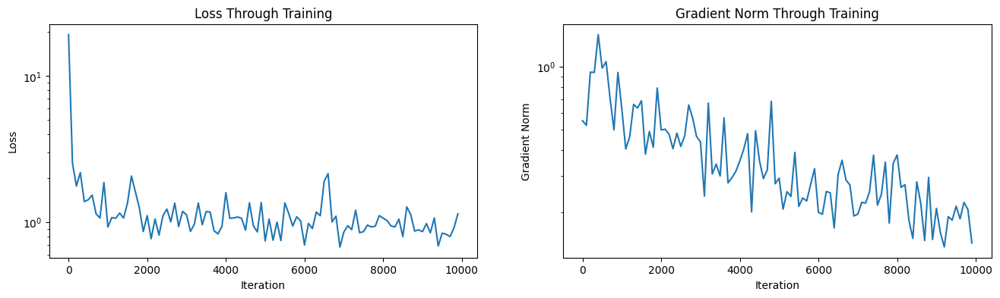

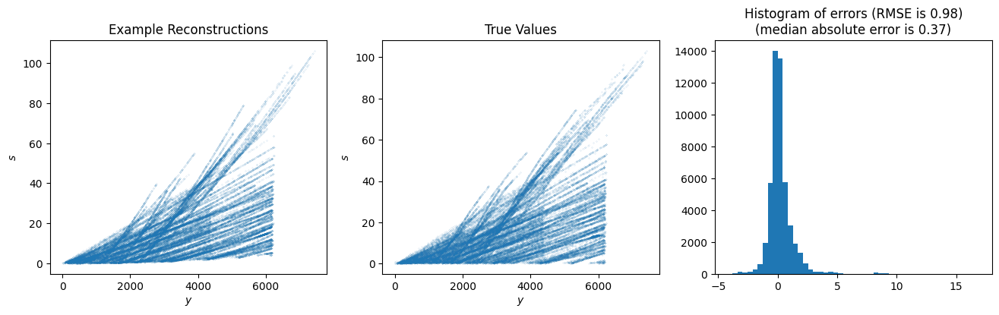

In [39]:
# plot loss log and sample predictions
model.plot_training_log()
model.plot_predictions(init_batch)

### Looking at UQ

In [40]:
num_ps = 101
num_hs=8
ps = jnp.linspace(0, 8000, num_ps)
hs = jnp.linspace(0, 70, num_hs)

ps, hs

(Array([   0.,   80.,  160.,  240.,  320.,  400.,  480.,  560.,  640.,
         720.,  800.,  880.,  960., 1040., 1120., 1200., 1280., 1360.,
        1440., 1520., 1600., 1680., 1760., 1840., 1920., 2000., 2080.,
        2160., 2240., 2320., 2400., 2480., 2560., 2640., 2720., 2800.,
        2880., 2960., 3040., 3120., 3200., 3280., 3360., 3440., 3520.,
        3600., 3680., 3760., 3840., 3920., 4000., 4080., 4160., 4240.,
        4320., 4400., 4480., 4560., 4640., 4720., 4800., 4880., 4960.,
        5040., 5120., 5200., 5280., 5360., 5440., 5520., 5600., 5680.,
        5760., 5840., 5920., 6000., 6080., 6160., 6240., 6320., 6400.,
        6480., 6560., 6640., 6720., 6800., 6880., 6960., 7040., 7120.,
        7200., 7280., 7360., 7440., 7520., 7600., 7680., 7760., 7840.,
        7920., 8000.], dtype=float32),
 Array([ 0., 10., 20., 30., 40., 50., 60., 70.], dtype=float32))

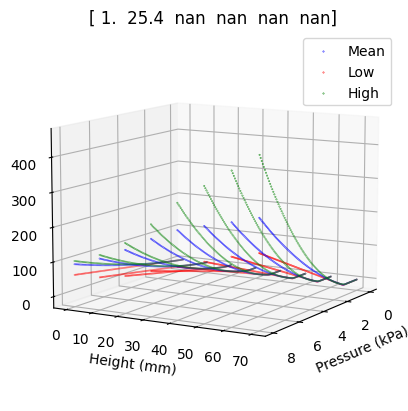

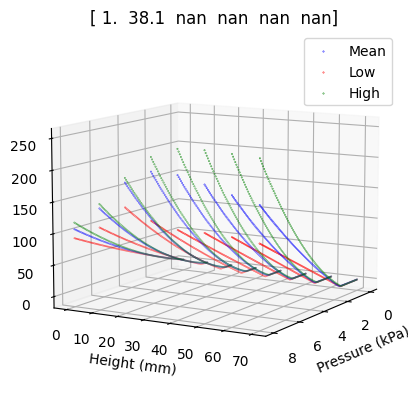

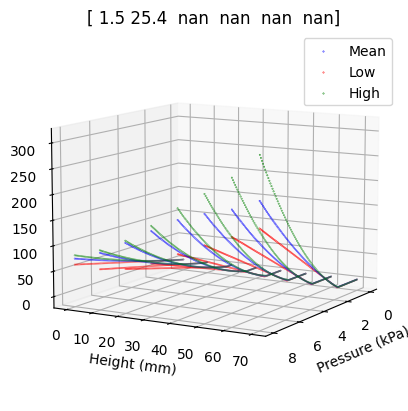

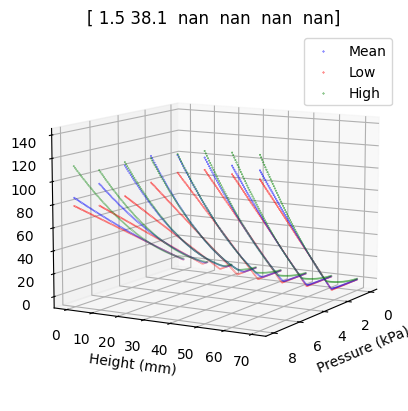

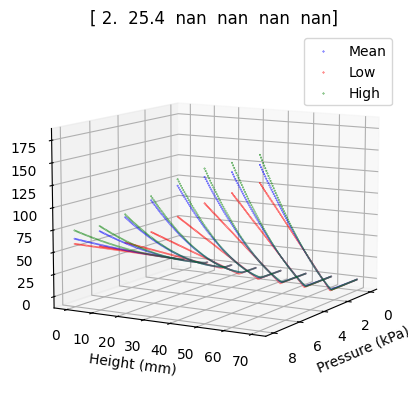

...

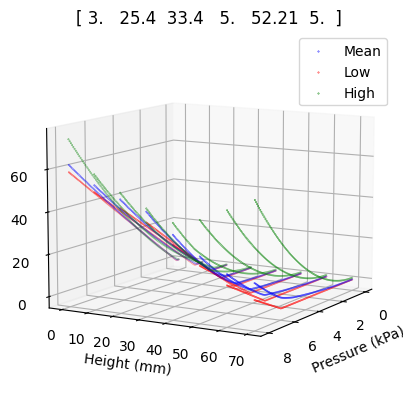

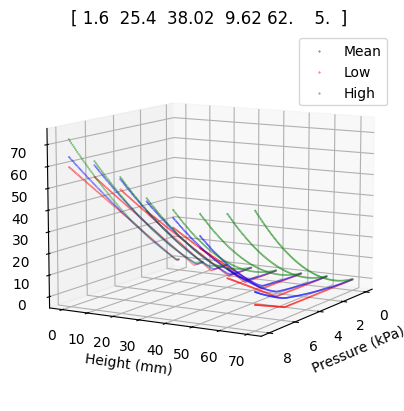

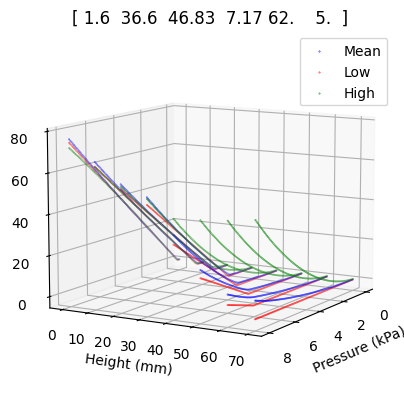

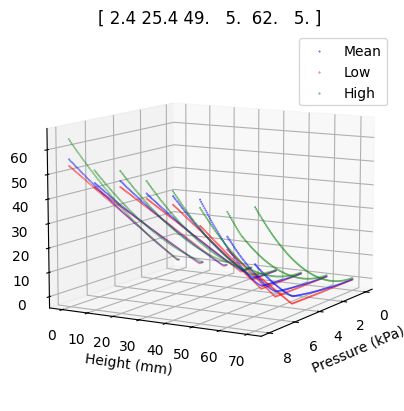

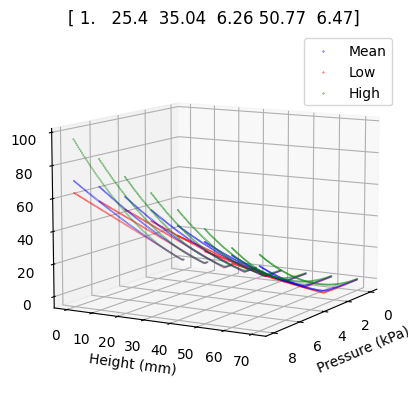

In [41]:
for membrane in full_data_dict.keys():
    memb_coeffs = full_data_dict[membrane][0][0][0][1:]
    us = jnp.concatenate([
            hs[:,None],
            jnp.tile(memb_coeffs, (num_hs,1))
        ],axis=-1) # shape (num_hs, 7)

    us = jnp.repeat(us, num_ps, axis=0) # shape (num_hs*num_ps, 7)
    ys = jnp.tile(ps, num_hs)[:,None] # shape (num_hs*num_ps, 1)

    fs = model.apply(model.params, us, ys) # shape (num_ensemble, num_hs*num_ps, 1)
    max_idx = jnp.argmax(fs.mean(1).squeeze())
    max_pred = fs[max_idx]
    min_idx = jnp.argmin(fs.mean(1).squeeze())
    min_pred = fs[min_idx]
    avg_pred = fs.mean(0)

    # plot low_Fs
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(ys.squeeze()/1000, us[:,0], avg_pred.squeeze(), c='b', s=0.1, marker='o')
    ax.scatter(ys.squeeze()/1000, us[:,0], min_pred.squeeze(), c='r', s=0.1, marker='o')
    ax.scatter(ys.squeeze()/1000, us[:,0], max_pred.squeeze(), c='g', s=0.1, marker='o')
    ax.set_xlabel('Pressure (kPa)')
    ax.set_ylabel('Height (mm)')
    ax.set_zlabel('Force (N)')
    plt.legend(['Mean', 'Low', 'High'])
    plt.title(memb_coeffs)
    # change the view angle
    ax.view_init(elev=10, azim=30)

    plt.show()

membrane is [1.0, 25.4, nan, nan, nan, nan]


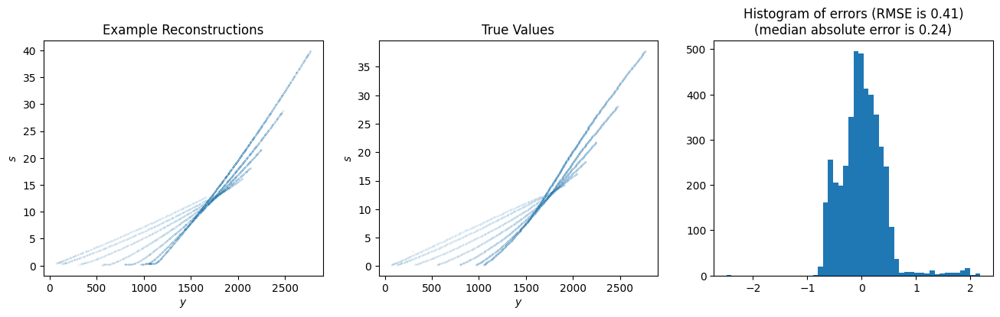

membrane is [1.0, 38.1, nan, nan, nan, nan]


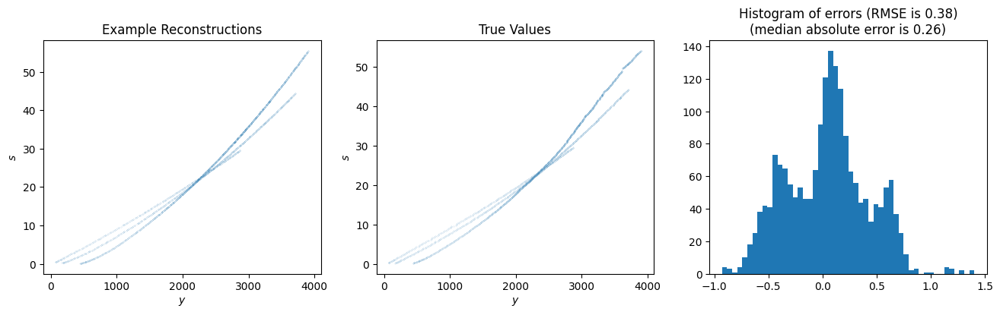

membrane is [1.5, 25.4, nan, nan, nan, nan]


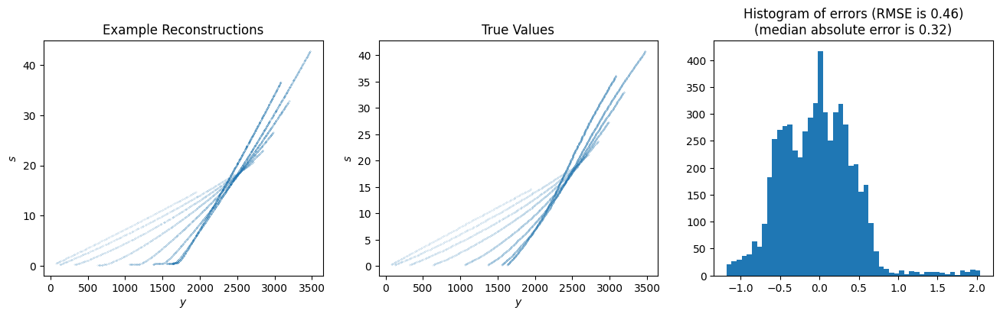

membrane is [1.5, 38.1, nan, nan, nan, nan]


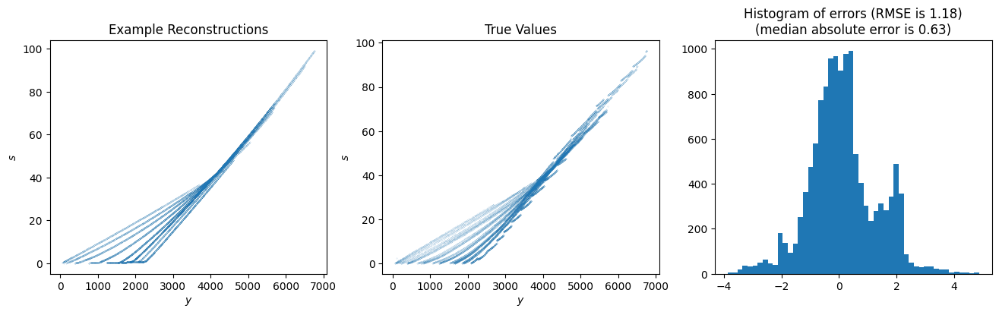

membrane is [2.0, 25.4, nan, nan, nan, nan]


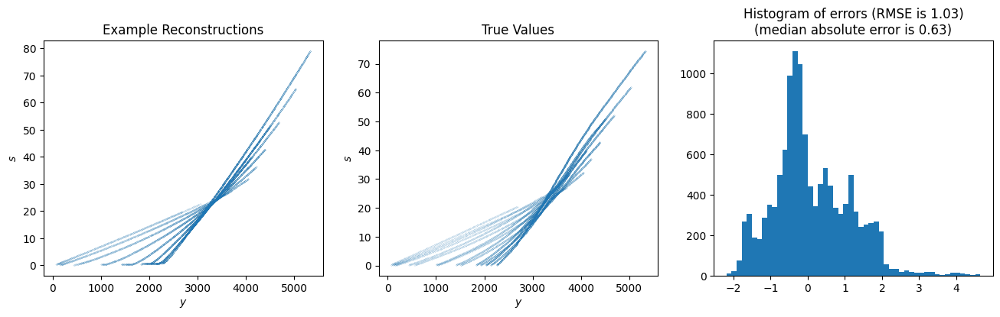

membrane is [2.0, 38.1, nan, nan, nan, nan]


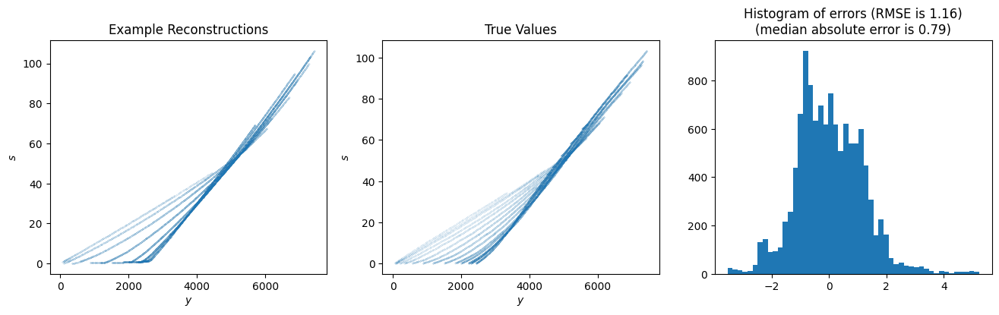

membrane is [1.0, 25.4, 41.2, 12.8, 62.0, 5.0]


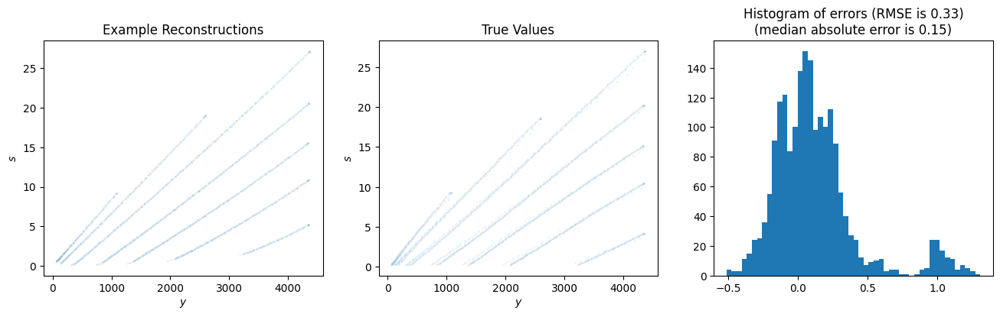

membrane is [3.0, 38.1, 49.0, 5.0, 62.0, 5.0]


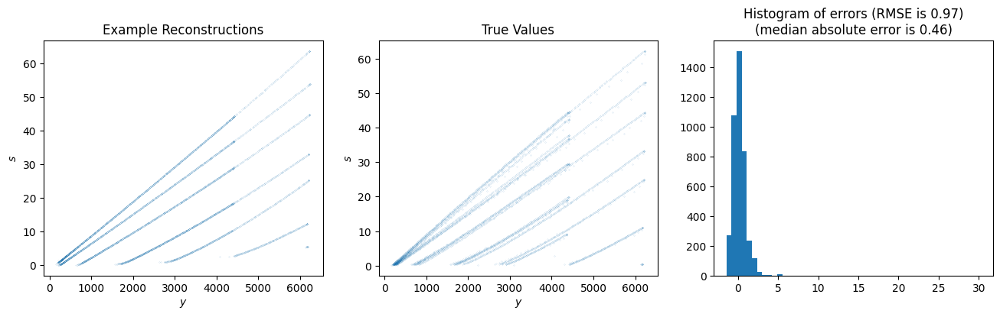

membrane is [3.0, 25.4, 34.73, 6.33, 55.53, 11.47]


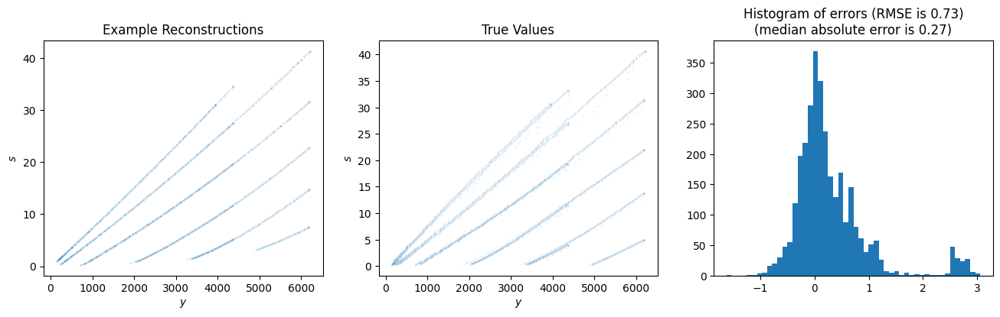

membrane is [1.0, 25.4, 33.4, 5.0, 46.4, 5.0]


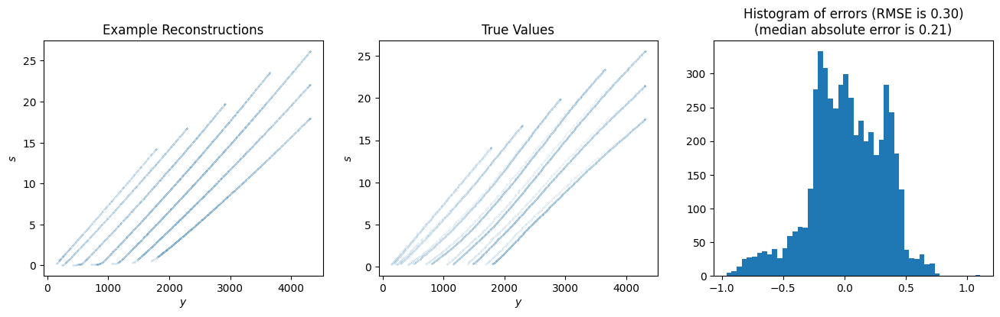

membrane is [1.0, 25.4, 33.4, 5.0, 57.05, 9.95]


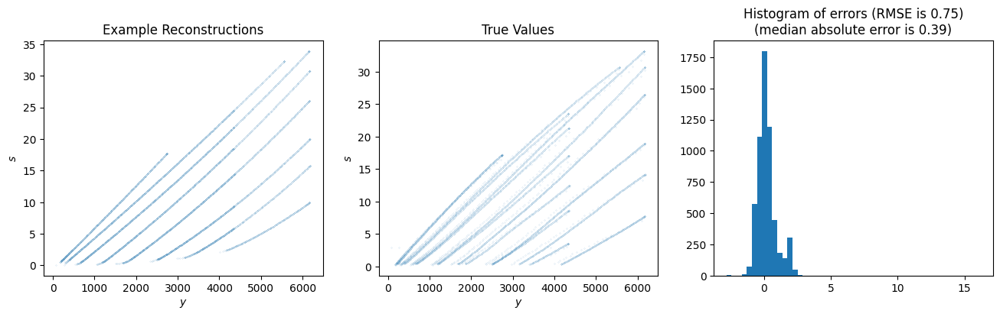

membrane is [1.0, 25.4, 49.0, 5.0, 62.0, 5.0]


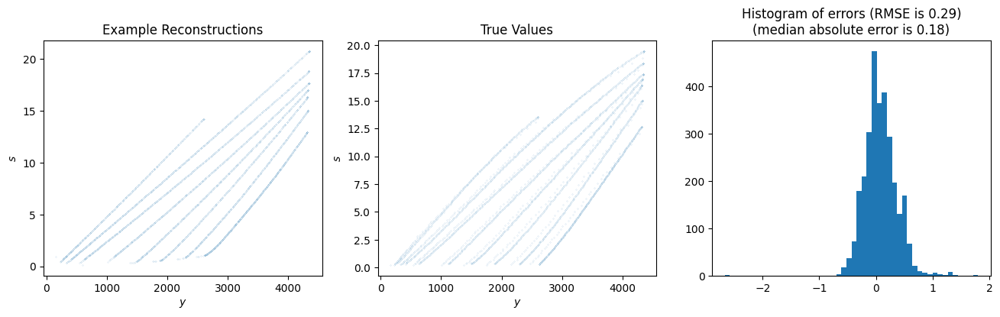

membrane is [1.0, 38.1, 46.1, 5.0, 59.1, 5.0]


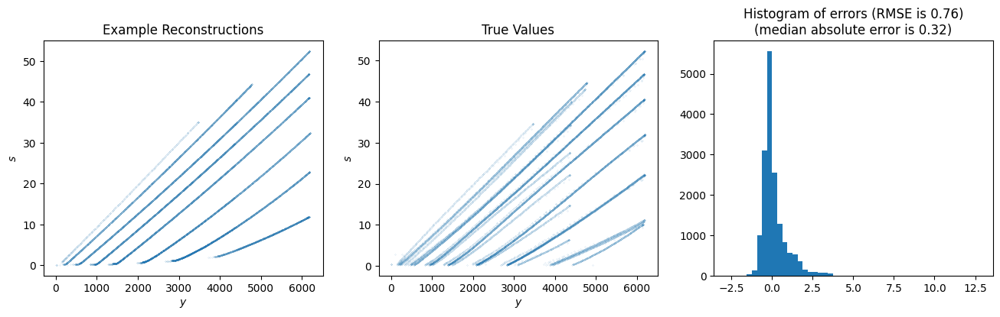

membrane is [1.0, 25.4, 37.69, 9.29, 58.49, 8.51]


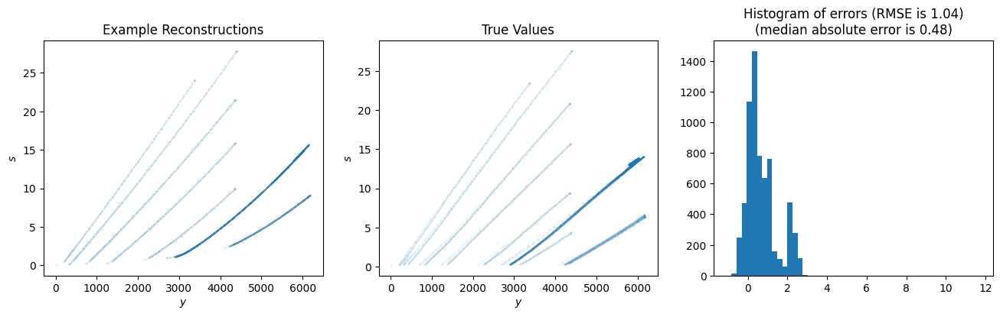

membrane is [1.0, 25.4, 36.06, 7.66, 51.72, 5.0]


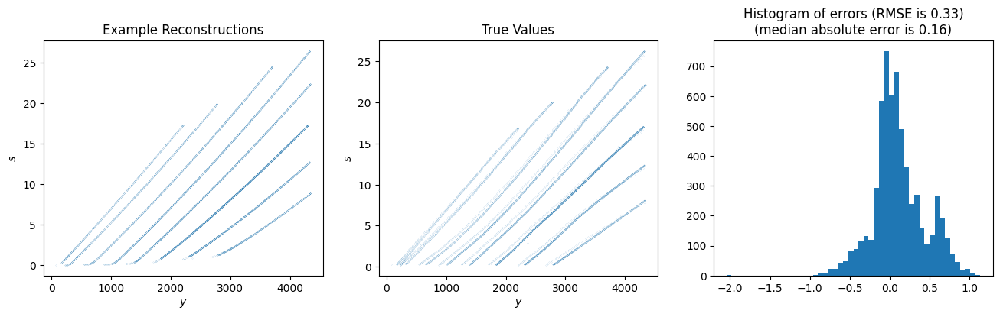

membrane is [1.0, 25.4, 44.81, 6.65, 60.73, 6.27]


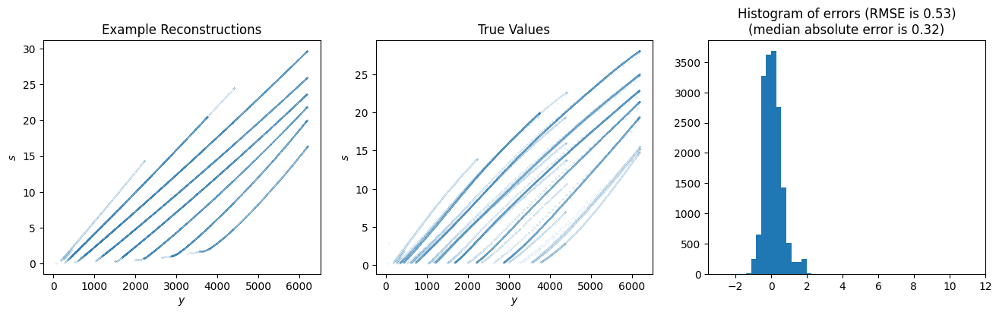

membrane is [3.0, 25.4, 40.43, 12.03, 61.23, 5.77]


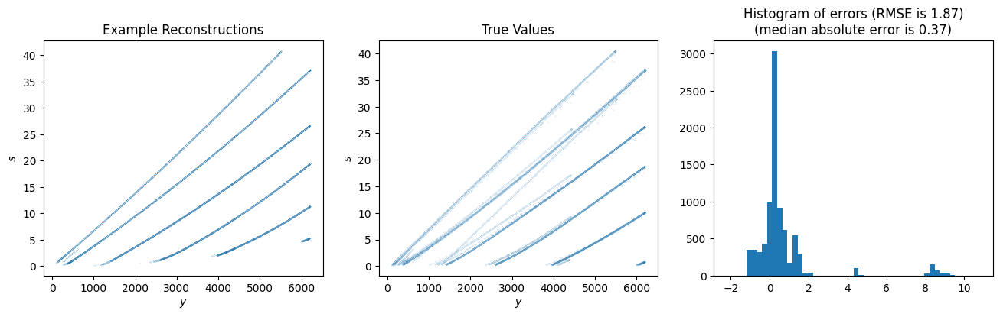

membrane is [3.0, 25.4, 33.4, 5.0, 52.21, 5.0]


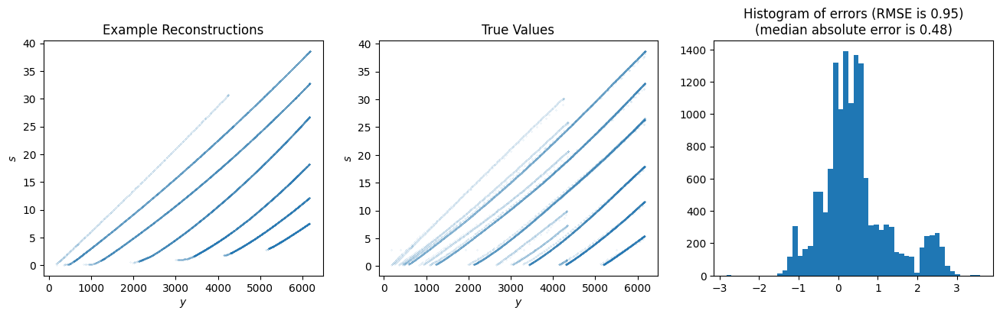

membrane is [1.6, 25.4, 38.02, 9.62, 62.0, 5.0]


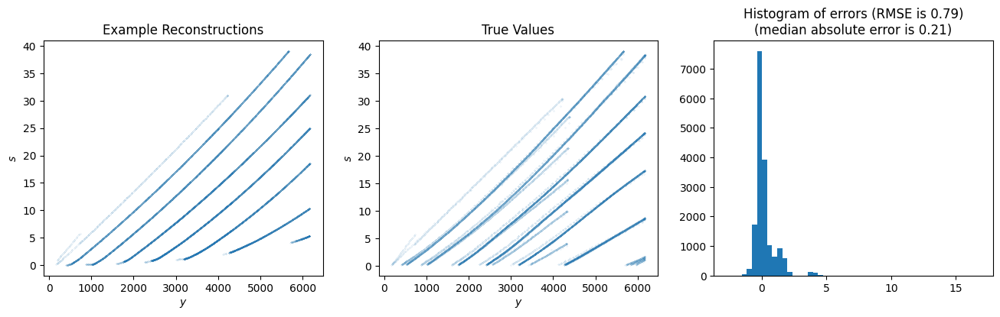

membrane is [1.6, 36.6, 46.83, 7.17, 62.0, 5.0]


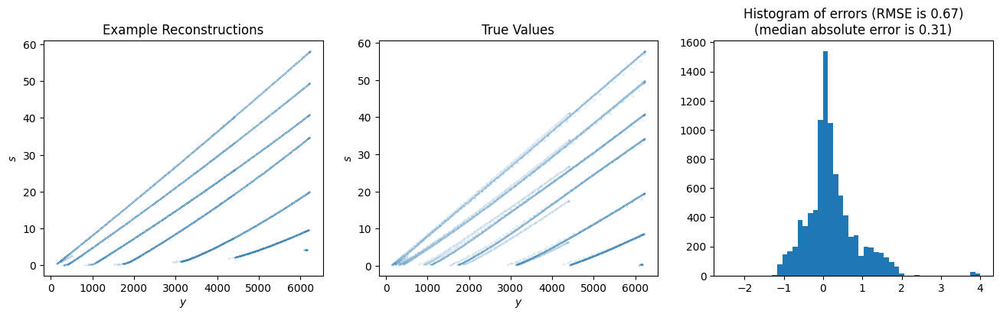

membrane is [2.4, 25.4, 49.0, 5.0, 62.0, 5.0]


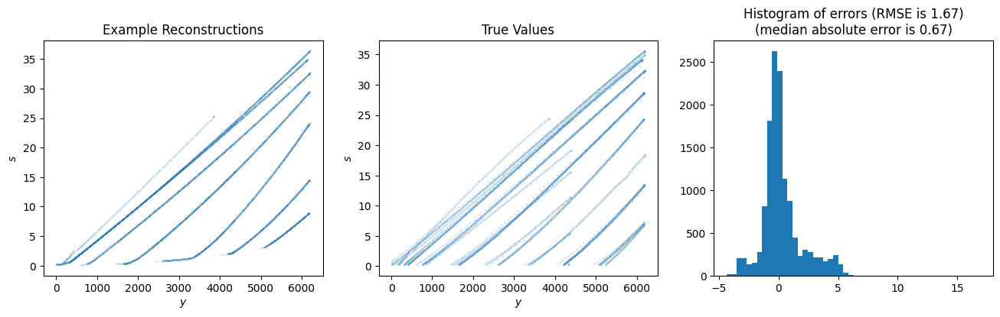

membrane is [1.0, 25.4, 35.04, 6.26, 50.77, 6.47]


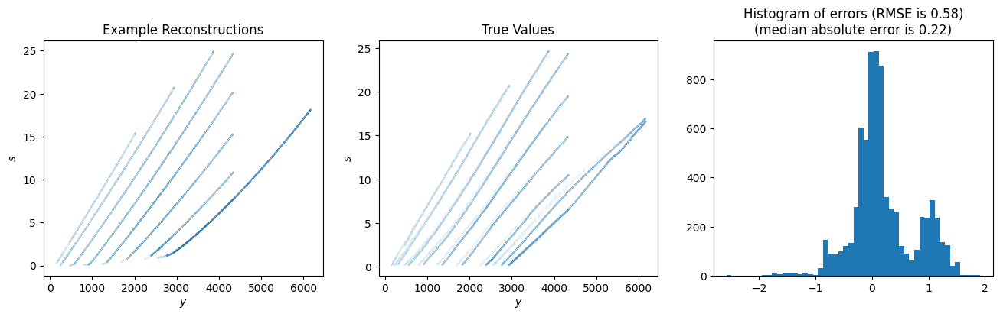

In [42]:
for membrane in full_data_dict.keys():
    print(f"membrane is {membrane}")
    (us, ys), fs, ws = full_data_dict[membrane]
    fs=model.plot_predictions(full_data_dict[membrane], return_predictions=True, use_uq=True)

# Polynomial degree 3

### Training

In [43]:
# Define Model
ring_encoder = RingEncoding(24,
                            MLP([16,5]))
latent_encoder = MLP([32, 32, 32, 32], output_activation=nn.gelu)
arch = MonotonicActuator(ring_encoder,
                     latent_encoder,
                     polynomial_degree=3)
ensemble = RPNEnsemble(arch, 32)

data_loader = BatchedDataset(train_data, key=random.PRNGKey(58), batch_size=50_000, has_weights=True)
init_batch = next(iter(data_loader))

model = Operator(ensemble, init_batch, has_weights=True)
print(model.tabulate())


                                             RPNEnsemble Summary                                              
┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┓
┃ path                 ┃ module            ┃ inputs             ┃ outputs             ┃ params               ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━┩
│                      │ RPNEnsemble       │ - float32[50000,7] │ float32[32,50000,1] │                      │
│                      │                   │ - float32[50000,1] │                     │                      │
├──────────────────────┼───────────────────┼────────────────────┼─────────────────────┼──────────────────────┤
│ OperatorEnsemble_0   │ OperatorEnsemble  │ - float32[50000,7] │ float32[64,50000,1] │                      │
│                      │                   │ - float32[50000,1] │                     │                      │


In [44]:
# train model
model = Operator(ensemble, init_batch, has_weights=True) #restart model
data_loader = BatchedDataset(train_data, key=random.PRNGKey(58), batch_size=500, has_weights=True) # restart data loader
model.train(data_loader, nIter=10_000)

100%|██████████| 10000/10000 [00:12<00:00, 778.97it/s, loss=3.1990108, grad_norm=0.30985814]


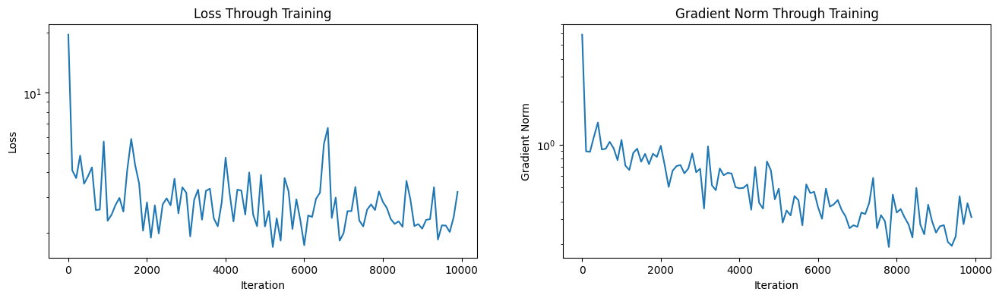

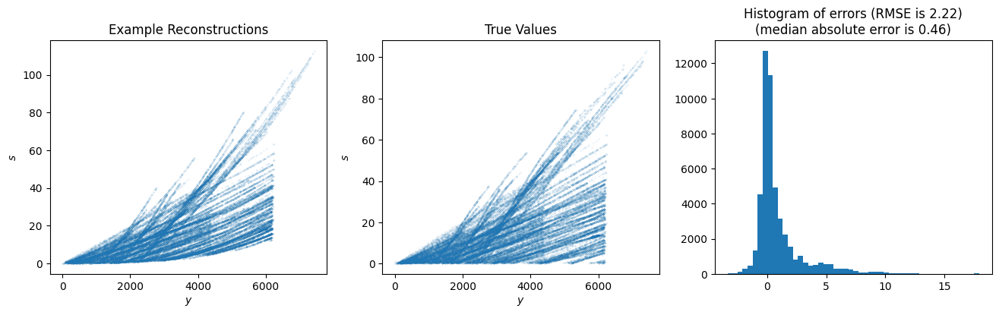

In [45]:
# plot loss log and sample predictions
model.plot_training_log()
model.plot_predictions(init_batch)

### Looking at UQ

In [46]:
num_ps = 101
num_hs=8
ps = jnp.linspace(0, 8000, num_ps)
hs = jnp.linspace(0, 70, num_hs)

ps, hs

(Array([   0.,   80.,  160.,  240.,  320.,  400.,  480.,  560.,  640.,
         720.,  800.,  880.,  960., 1040., 1120., 1200., 1280., 1360.,
        1440., 1520., 1600., 1680., 1760., 1840., 1920., 2000., 2080.,
        2160., 2240., 2320., 2400., 2480., 2560., 2640., 2720., 2800.,
        2880., 2960., 3040., 3120., 3200., 3280., 3360., 3440., 3520.,
        3600., 3680., 3760., 3840., 3920., 4000., 4080., 4160., 4240.,
        4320., 4400., 4480., 4560., 4640., 4720., 4800., 4880., 4960.,
        5040., 5120., 5200., 5280., 5360., 5440., 5520., 5600., 5680.,
        5760., 5840., 5920., 6000., 6080., 6160., 6240., 6320., 6400.,
        6480., 6560., 6640., 6720., 6800., 6880., 6960., 7040., 7120.,
        7200., 7280., 7360., 7440., 7520., 7600., 7680., 7760., 7840.,
        7920., 8000.], dtype=float32),
 Array([ 0., 10., 20., 30., 40., 50., 60., 70.], dtype=float32))

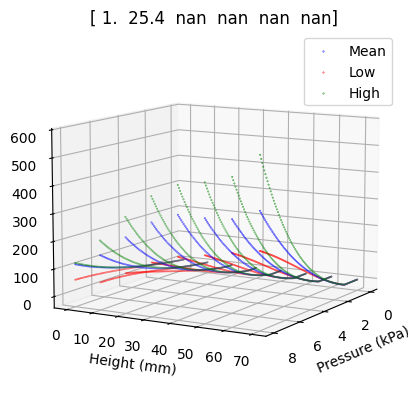

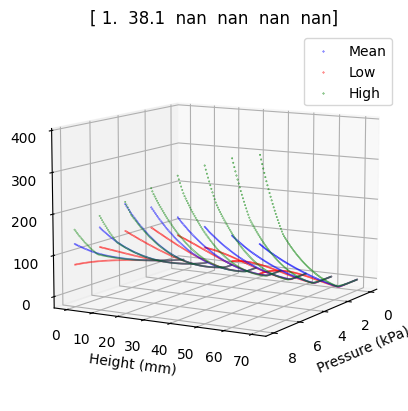

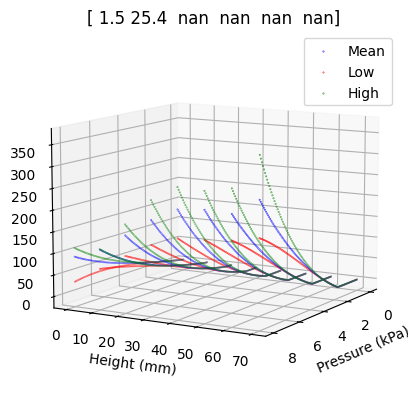

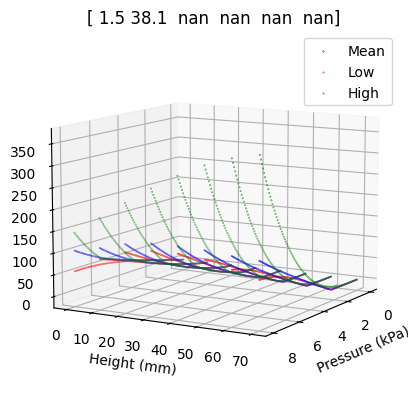

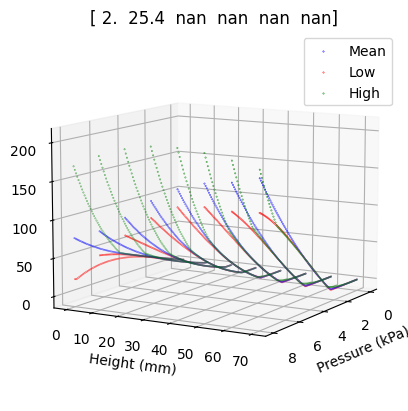

...

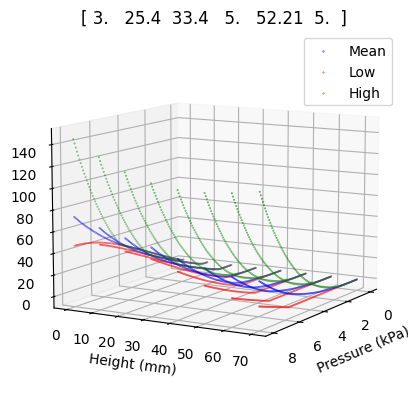

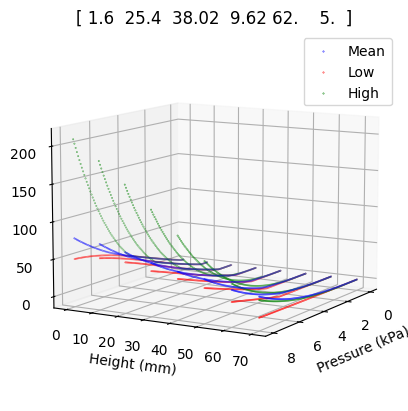

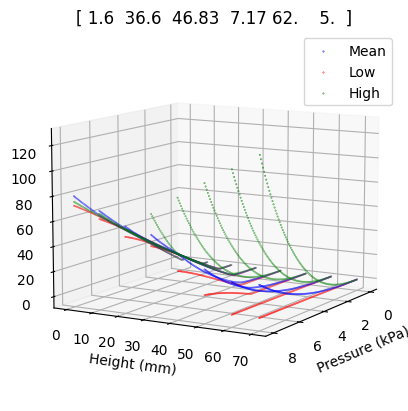

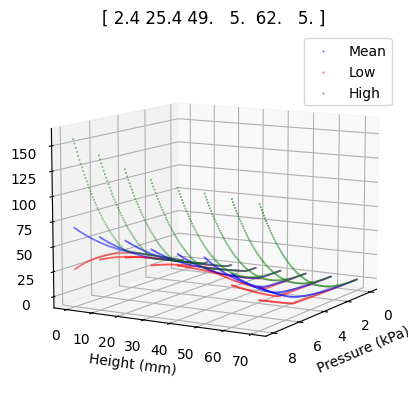

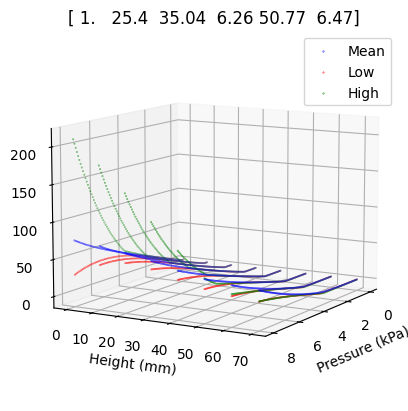

In [47]:
for membrane in full_data_dict.keys():
    memb_coeffs = full_data_dict[membrane][0][0][0][1:]
    us = jnp.concatenate([
            hs[:,None],
            jnp.tile(memb_coeffs, (num_hs,1))
        ],axis=-1) # shape (num_hs, 7)

    us = jnp.repeat(us, num_ps, axis=0) # shape (num_hs*num_ps, 7)
    ys = jnp.tile(ps, num_hs)[:,None] # shape (num_hs*num_ps, 1)

    fs = model.apply(model.params, us, ys) # shape (num_ensemble, num_hs*num_ps, 1)
    max_idx = jnp.argmax(fs.mean(1).squeeze())
    max_pred = fs[max_idx]
    min_idx = jnp.argmin(fs.mean(1).squeeze())
    min_pred = fs[min_idx]
    avg_pred = fs.mean(0)

    # plot low_Fs
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(ys.squeeze()/1000, us[:,0], avg_pred.squeeze(), c='b', s=0.1, marker='o')
    ax.scatter(ys.squeeze()/1000, us[:,0], min_pred.squeeze(), c='r', s=0.1, marker='o')
    ax.scatter(ys.squeeze()/1000, us[:,0], max_pred.squeeze(), c='g', s=0.1, marker='o')
    ax.set_xlabel('Pressure (kPa)')
    ax.set_ylabel('Height (mm)')
    ax.set_zlabel('Force (N)')
    plt.legend(['Mean', 'Low', 'High'])
    plt.title(memb_coeffs)
    # change the view angle
    ax.view_init(elev=10, azim=30)

    plt.show()

membrane is [1.0, 25.4, nan, nan, nan, nan]


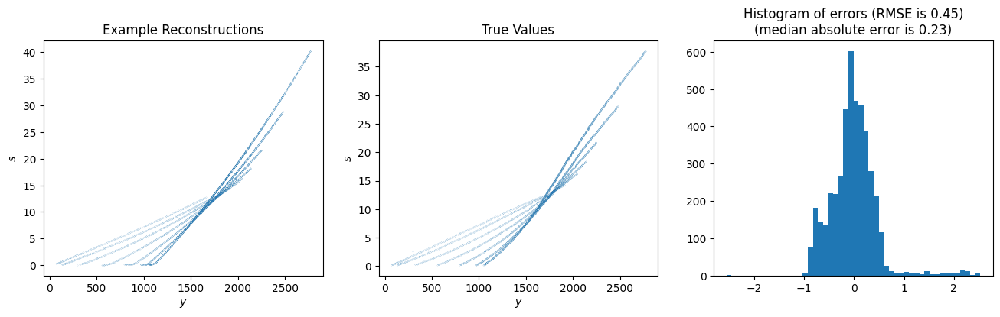

membrane is [1.0, 38.1, nan, nan, nan, nan]


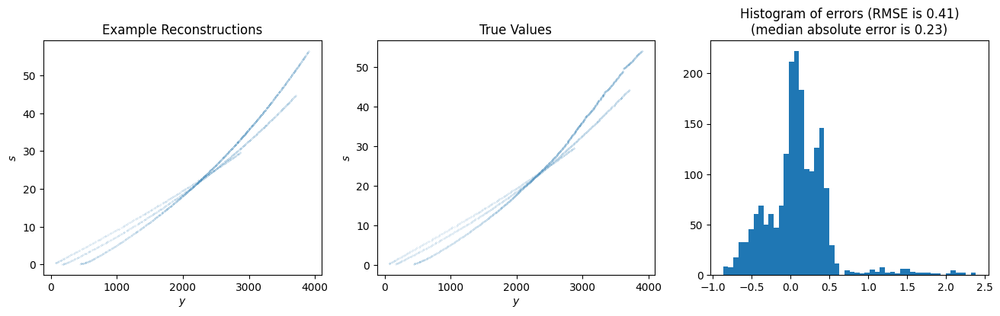

membrane is [1.5, 25.4, nan, nan, nan, nan]


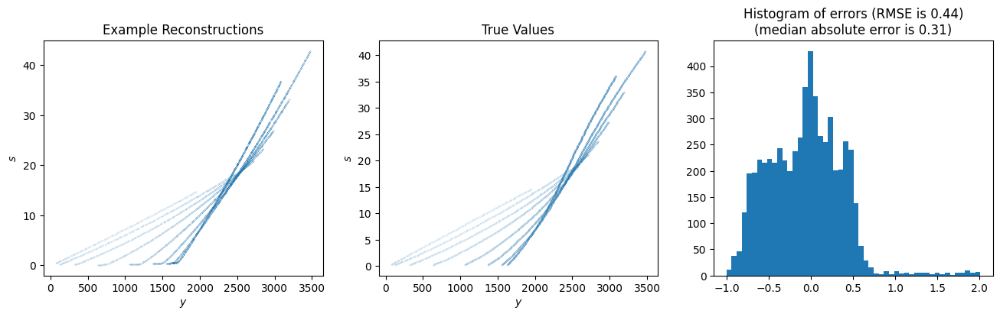

membrane is [1.5, 38.1, nan, nan, nan, nan]


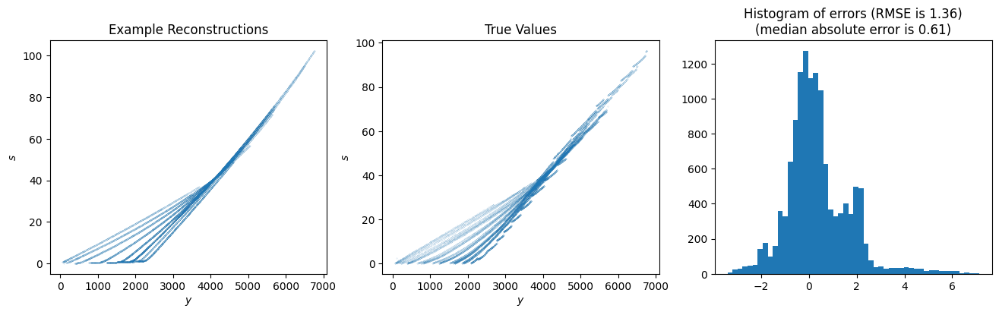

membrane is [2.0, 25.4, nan, nan, nan, nan]


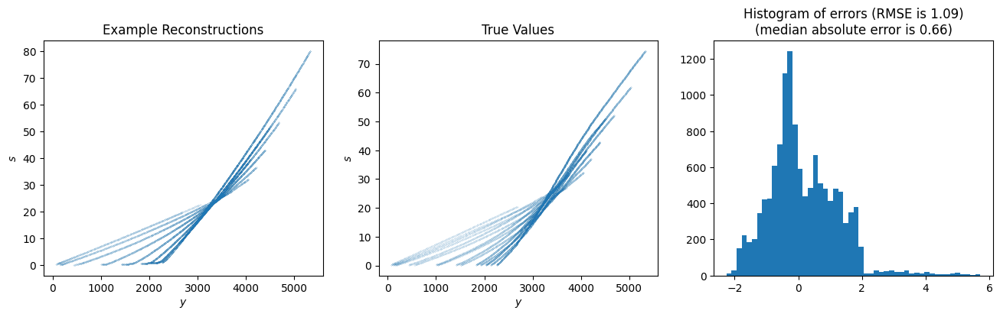

membrane is [2.0, 38.1, nan, nan, nan, nan]


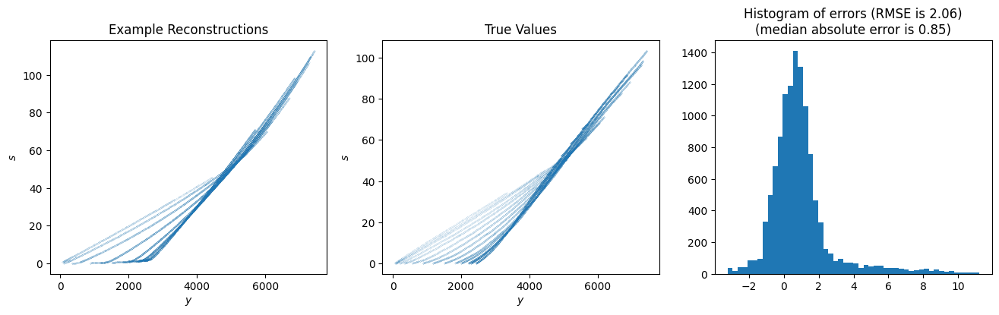

membrane is [1.0, 25.4, 41.2, 12.8, 62.0, 5.0]


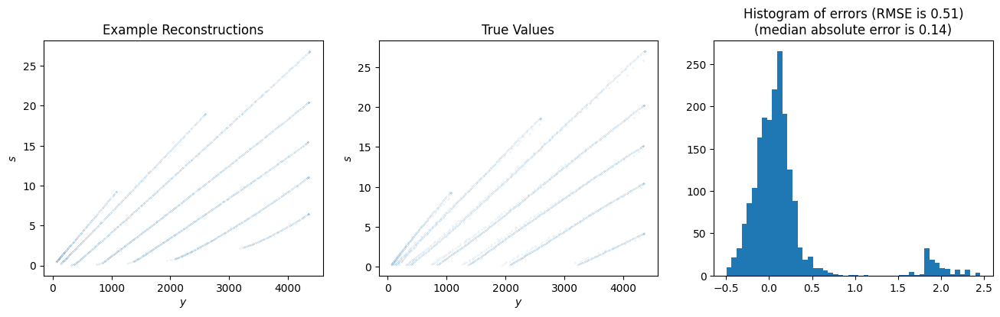

membrane is [3.0, 38.1, 49.0, 5.0, 62.0, 5.0]


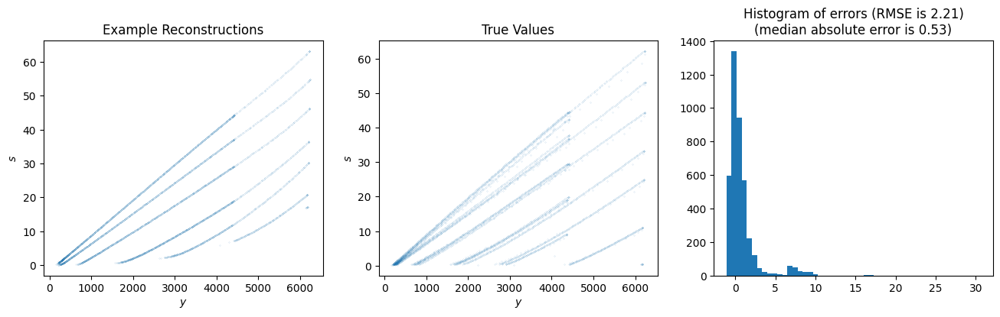

membrane is [3.0, 25.4, 34.73, 6.33, 55.53, 11.47]


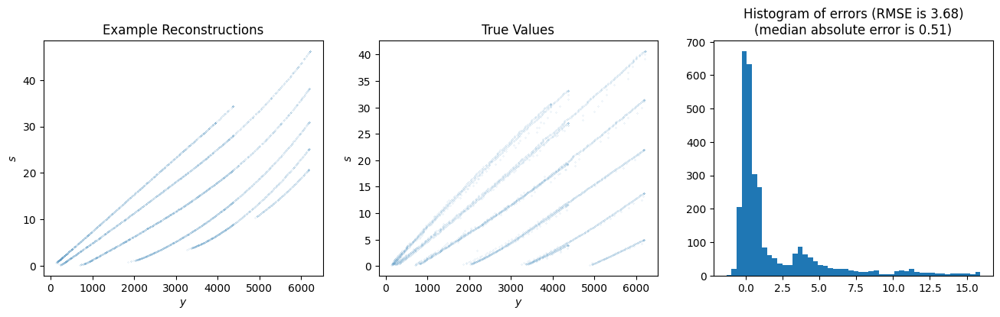

membrane is [1.0, 25.4, 33.4, 5.0, 46.4, 5.0]


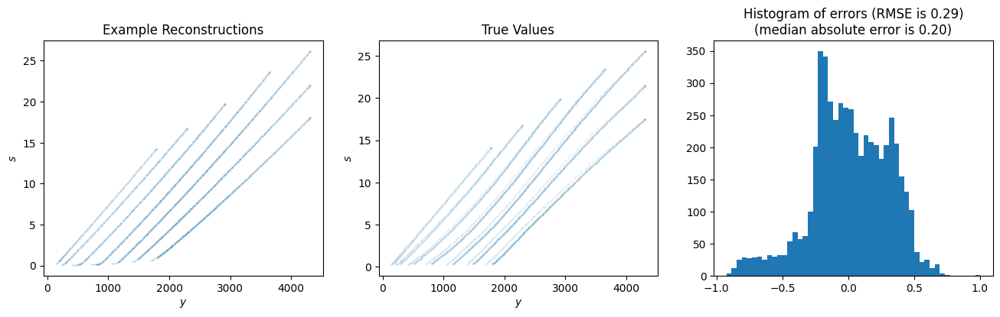

membrane is [1.0, 25.4, 33.4, 5.0, 57.05, 9.95]


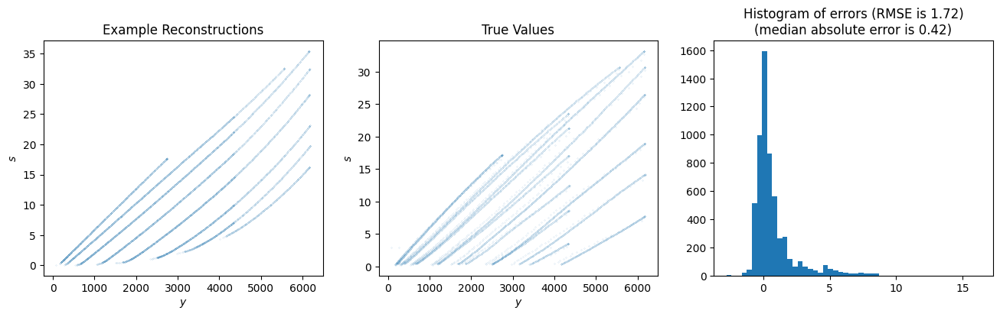

membrane is [1.0, 25.4, 49.0, 5.0, 62.0, 5.0]


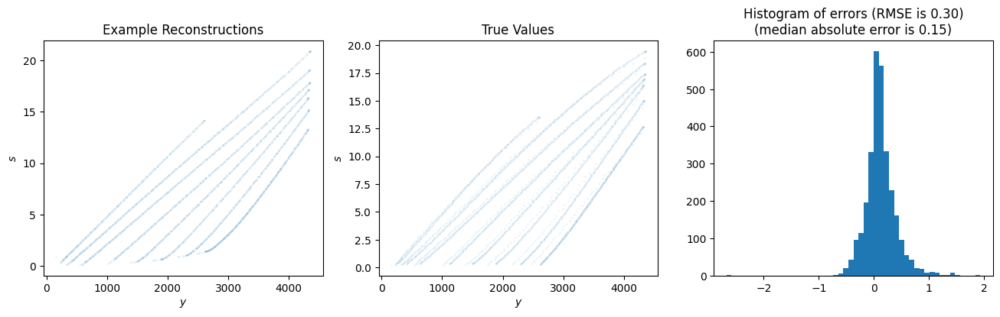

membrane is [1.0, 38.1, 46.1, 5.0, 59.1, 5.0]


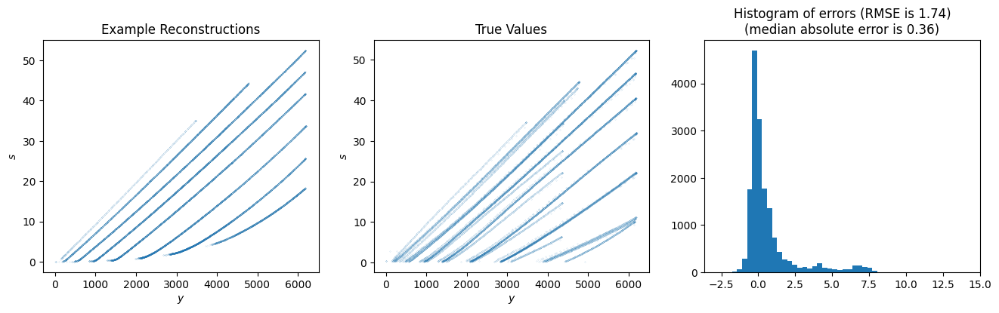

membrane is [1.0, 25.4, 37.69, 9.29, 58.49, 8.51]


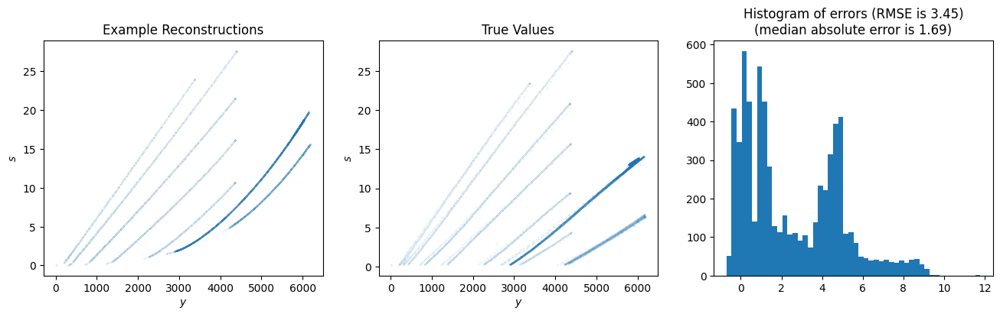

membrane is [1.0, 25.4, 36.06, 7.66, 51.72, 5.0]


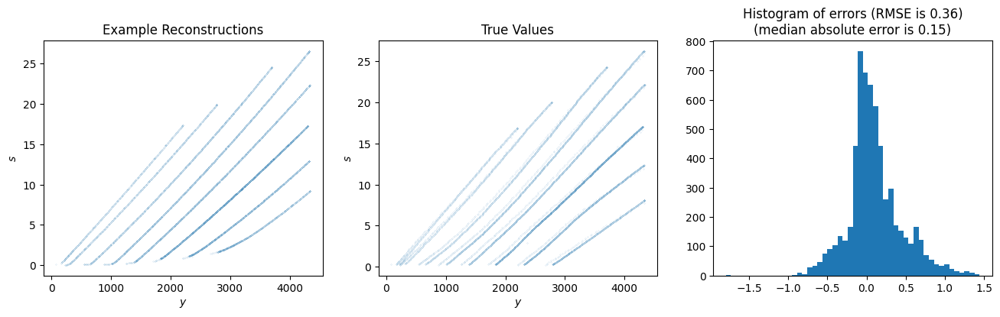

membrane is [1.0, 25.4, 44.81, 6.65, 60.73, 6.27]


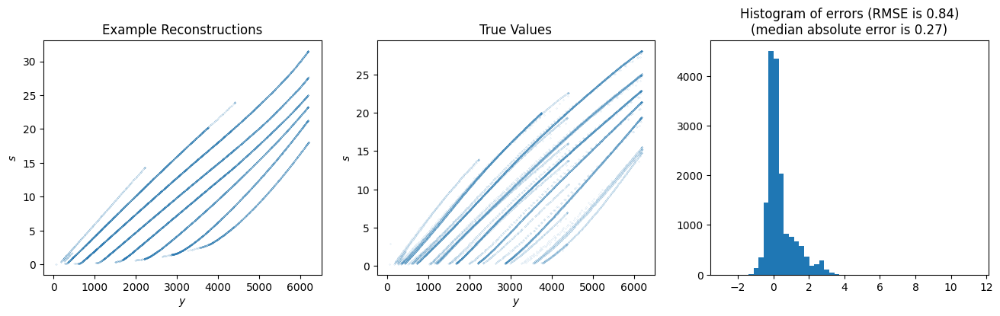

membrane is [3.0, 25.4, 40.43, 12.03, 61.23, 5.77]


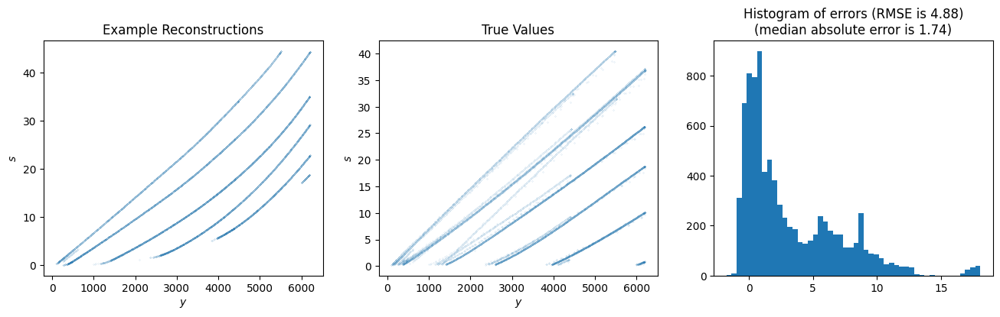

membrane is [3.0, 25.4, 33.4, 5.0, 52.21, 5.0]


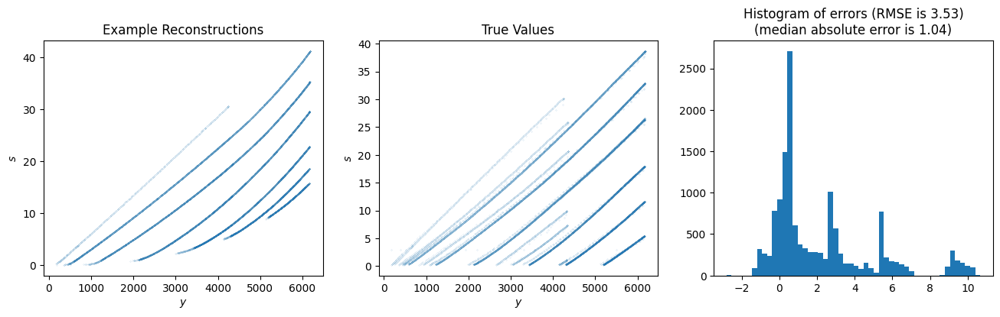

membrane is [1.6, 25.4, 38.02, 9.62, 62.0, 5.0]


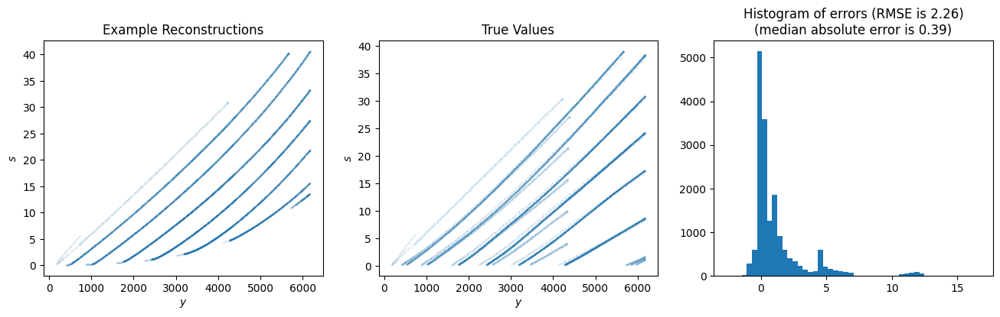

membrane is [1.6, 36.6, 46.83, 7.17, 62.0, 5.0]


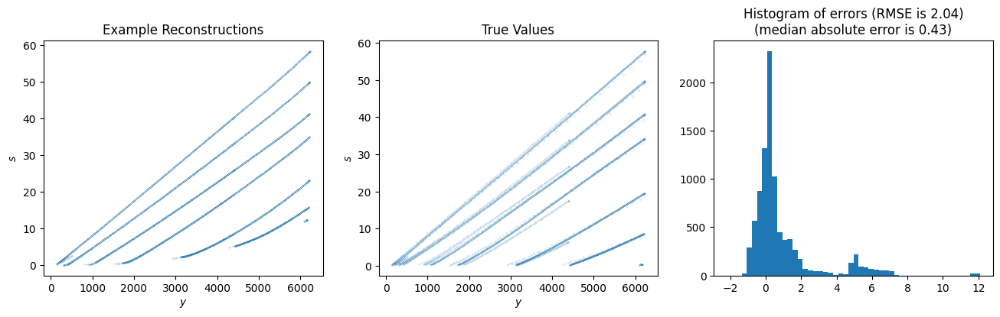

membrane is [2.4, 25.4, 49.0, 5.0, 62.0, 5.0]


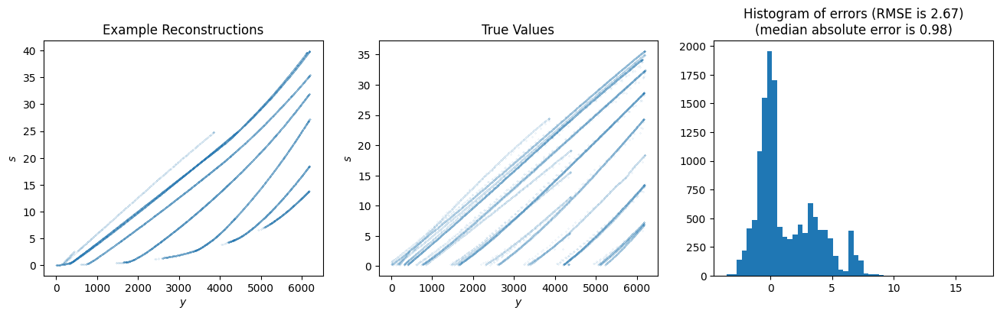

membrane is [1.0, 25.4, 35.04, 6.26, 50.77, 6.47]


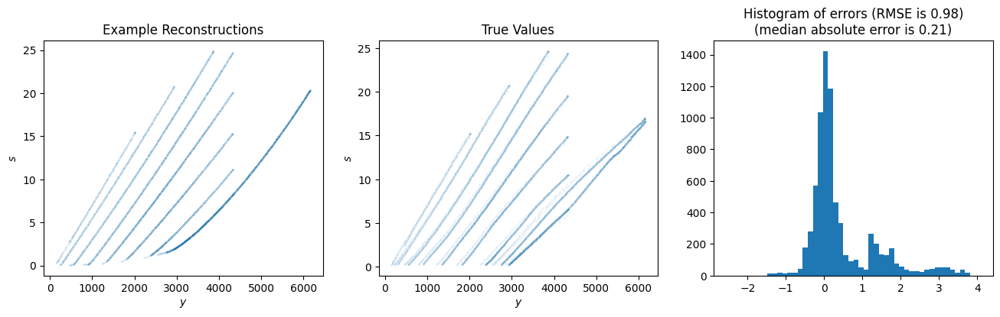

In [48]:
for membrane in full_data_dict.keys():
    print(f"membrane is {membrane}")
    (us, ys), fs, ws = full_data_dict[membrane]
    fs=model.plot_predictions(full_data_dict[membrane], return_predictions=True, use_uq=True)